In [15]:
import pandas as pd
import numpy as np
import seaborn as sns

df = pd.read_csv('../data/raw/fullpilot1455.csv')

df = df[df.expName.isin(['FullPilot14'])]

df = df.groupby('prolificID').filter(lambda x: len(x) >= 483)
# df = df.groupby('prolificID').filter(lambda x: len(x) <= 432)
# keep  prolificIDs that are more than 10 characters
df = df[df.prolificID.str.len() > 10]
# show prolificIDs
print(f'N = {len(df.prolificID.unique())}')

N = 54


In [2]:
prolific_ids = [
    "675edf24452fd3015aaee4dc",
    "66885d217777eda6f3a9b8dd",
    "675bead4e4f525677a43a27a",
    "5ddb5ed4a64380abb2907440",
    "67603ec6f369599a362eecb9",
    "673efaa7caf0942718ac1631",
    "675da16368f40dd379799754",
    "62b9e995fd8c321a2f65a6cd",
    "5d23ac815173fe001528bcd6",
    "5fe17e28d8918b3fae67ec4d",
    "65cbb41e2614de61e770c67c",
    "60165591d472ae0b5c202703",
    "675967674f07f1afe5626a04",
    "675efe6044b2f5bde425ceac",
    "6165af4b36cb3bae91f2e355",
    "673487045133bc17c8100d16",
    "6752385b8b997da454e1b2b4",
    "6648c0d4fa3b00043396163e",
    "671813a64cc728d09ef7499d",
    "6707ab0e3c5ee9540950263a",
    "675d2f5d0cc936cb053e09eb",
    "675708ab3fe4f014cb8f3100",
    "6669b17afde17ee81cebd908"
]


In [3]:
scores = []
scores2 = []
for pid in prolific_ids:
    score = df[(df.prolificID == pid) & (df.choice==1)].outcome1.sum()+ df[(df.prolificID == pid) & (df.choice==2)].outcome2.sum()
    print(f'{pid},{np.round(score*0.00002, 2)}')
    scores.append(score*0.00002)
    # score2 = df[(df.prolificID == pid)].opti_ev.mean()
    # scores2.append(score2)
    

675edf24452fd3015aaee4dc,3.67
66885d217777eda6f3a9b8dd,3.97
675bead4e4f525677a43a27a,3.7
5ddb5ed4a64380abb2907440,3.9
67603ec6f369599a362eecb9,4.01
673efaa7caf0942718ac1631,2.82
675da16368f40dd379799754,2.99
62b9e995fd8c321a2f65a6cd,3.9
5d23ac815173fe001528bcd6,2.73
5fe17e28d8918b3fae67ec4d,3.65
65cbb41e2614de61e770c67c,3.84
60165591d472ae0b5c202703,3.51
675967674f07f1afe5626a04,3.64
675efe6044b2f5bde425ceac,3.15
6165af4b36cb3bae91f2e355,4.07
673487045133bc17c8100d16,3.85
6752385b8b997da454e1b2b4,3.95
6648c0d4fa3b00043396163e,3.6
671813a64cc728d09ef7499d,2.91
6707ab0e3c5ee9540950263a,3.62
675d2f5d0cc936cb053e09eb,3.06
675708ab3fe4f014cb8f3100,3.96
6669b17afde17ee81cebd908,3.81


24 24


<Axes: >

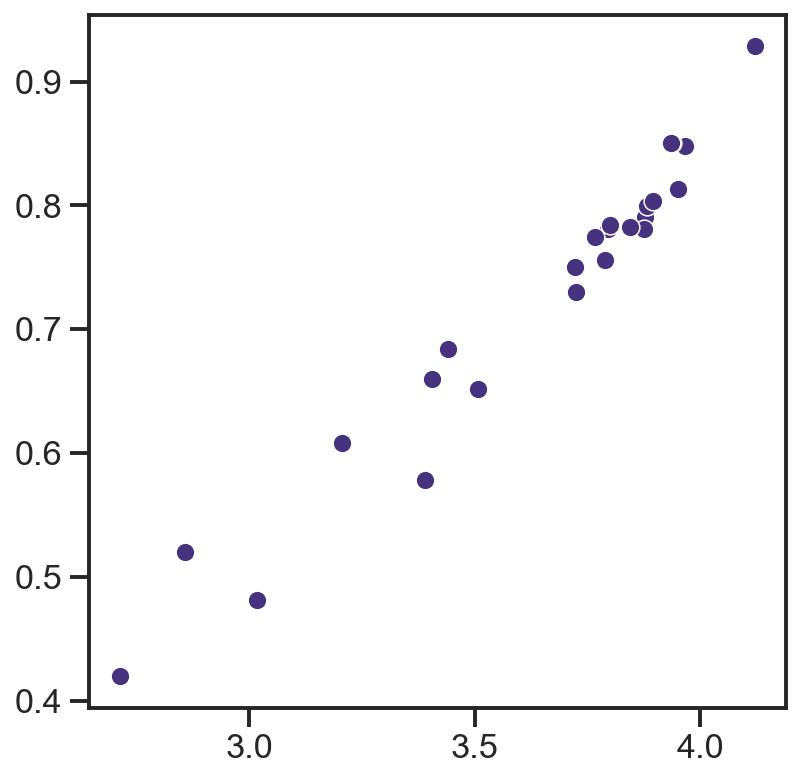

In [91]:
print(len(scores), len(scores2))
sns.scatterplot(x=scores, y=scores2)


In [16]:

df['opti_ss'] = ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))

In [17]:
expName = ['FullPilot14']
session = 3
df_ = df[(df.session==session) & (df.expName.isin(expName))].groupby(['prolificID'], as_index=False).mean(numeric_only=True)

import scipy.stats as stats

df_['delta'] = df_.opti_ff - df_.opti_ss

df_['opti_ff'] = df_.opti_ff.astype(float)
df_['opti_ss'] = df_.opti_ss.astype(float)
df_['delta'] = df_.delta.astype(float)
df['opti_ff'] = df['opti_ff'].astype(float)
df['opti_ss'] = df['opti_ss'].astype(float)
         
df2 = df[(df.session==session) & (df.expName.isin(expName))]

def get_group2(row):
    opti_ff = df2[df2.prolificID==row.prolificID].opti_ff
    opti_ss = df2[df2.prolificID==row.prolificID].opti_ss
    ttest = stats.ttest_rel(opti_ff, opti_ss)
    p = ttest.pvalue
    t = ttest.statistic
    p_ss = stats.ttest_1samp(opti_ss, 0.5, alternative='greater').pvalue < 0.05 
    p_ff = stats.ttest_1samp(opti_ff, 0.5, alternative='greater').pvalue < 0.05

    if p > 0.05:
        if p_ss and p_ff:
            return 'balanced'
        if p_ss:
            return 'value'
        if p_ff:
            return 'perceptual'
        return 'random'
    
    if t > 0 and p_ff:
        return 'perceptual'
    if t < 0  and p_ss:
        return 'value'

    return 'random'

def get_group(row):
    opti_ff = df2[df2.prolificID==row.prolificID].opti_ff
    opti_ss = df2[df2.prolificID==row.prolificID].opti_ss
    p_ss = stats.ttest_1samp(opti_ss, 0.5, alternative='greater').pvalue < 0.05 
    p_ff = stats.ttest_1samp(opti_ff, 0.5, alternative='greater').pvalue < 0.05

    if p_ss and p_ff:
        return 'combined'
        
    
    if p_ff:
        return 'perceptual'
    if p_ss:
        return 'value'

    return 'random'
    # raise ValueError('unexpected value')

df_['group'] = df_.apply(get_group, axis=1)

df['group'] = df['prolificID'].map(df_.set_index('prolificID')['group'])

# df = df[df.group != 'random']
print(len(df.prolificID.unique()))

54


In [18]:
expName = ['FullPilot14']
session = 4
df__ = df[(df.session==session) & (df.expName.isin(expName))].groupby(['prolificID'], as_index=False).mean(numeric_only=True)

import scipy.stats as stats


         
df2 = df[(df.session==session) & (df.expName.isin(expName))]

def get_group2(row):
    opti_ff = df2[df2.prolificID==row.prolificID].opti_ff
    opti_ss = df2[df2.prolificID==row.prolificID].opti_ss
    ttest = stats.ttest_rel(opti_ff, opti_ss)
    p = ttest.pvalue
    t = ttest.statistic
    p_ss = stats.ttest_1samp(opti_ss, 0.5, alternative='greater').pvalue < 0.05 
    p_ff = stats.ttest_1samp(opti_ff, 0.5, alternative='greater').pvalue < 0.05

    if p > 0.05:
        if p_ss and p_ff:
            return 'balanced'
        if p_ss:
            return 'value'
        if p_ff:
            return 'perceptual'
        return 'random'
    
    if t > 0 and p_ff:
        return 'perceptual'
    if t < 0  and p_ss:
        return 'value'

    return 'random'

def get_group(row):
    opti_ff = df2[df2.prolificID==row.prolificID].opti_ff
    opti_ss = df2[df2.prolificID==row.prolificID].opti_ss
    p_ss = stats.ttest_1samp(opti_ss, 0.5, alternative='greater').pvalue < 0.05 
    p_ff = stats.ttest_1samp(opti_ff, 0.5, alternative='greater').pvalue < 0.05

    if p_ss and p_ff:
        return 'combined'
        
    
    if p_ff:
        return 'perceptual'
    if p_ss:
        return 'value'

    return 'random'
    # raise ValueError('unexpected value')
df__ = df_.copy()
df__['group'] = df__.apply(get_group, axis=1)


# df = df[df.group != 'random']
print(len(df.prolificID.unique()))

54


C:\Users\basil\AppData\Local\Temp\ipykernel_16612\311933254.py:24: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df_, x='opti_ss', y='opti_ff', alpha=0.2, fill=True, palette=['C0', 'C2', 'C1', 'C7'], hue='group', levels=2, bw_adjust=0.6, thresh=0.001)


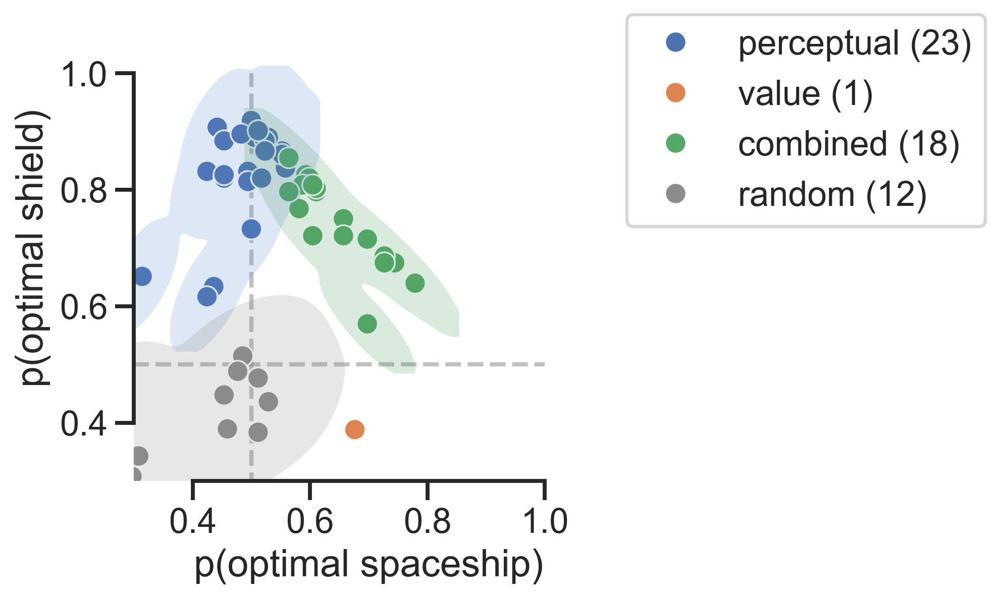

In [11]:
# same but with scatterplot

import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal

df_ = df[(df.expName=='FullPilot14') & (df.session==4)].groupby(['prolificID', 'group'], as_index=False).mean(numeric_only=True)
# df_ = df_[df_.group!='random']
sns.set(rc={'figure.figsize':(4,4), 'figure.dpi': 300})
sns.set_context("talk")
sns.set_style("ticks")


# sort by group 
order = ['perceptual', 'combined', 'value', 'random']
df_['group'] = pd.Categorical(df_['group'], categories=order, ordered=True)

# df_['opti_ss_training'] = df[(df.expName=='FullPilot14') & (df.session==2) & (df.group!='random')].groupby(['prolificID', 'group']).opti_ss.mean().values
# df_['opti_ff_training'] = df[(df.expName=='FullPilot14') & (df.session==1) & (df.group!='random')].groupby(['prolificID', 'group']).opti_ff.mean().values

scatter = sns.scatterplot(data=df_, x='opti_ss', y='opti_ff', hue='group', palette=['C0', 'C2', 'C1', 'C7'], s=100)


# using seaborn, we want a region of interest using the colors of the clusters in scatterplot
sns.kdeplot(data=df_, x='opti_ss', y='opti_ff', alpha=0.2, fill=True, palette=['C0', 'C2', 'C1', 'C7'], hue='group', levels=2, bw_adjust=0.6, thresh=0.001) 
# Draw kdeplot for clusters with sufficient points


            

# add a third dimension (opti_ev)
plt.ylim(0.3, 1.1)
plt.xlim(0.3, 1.1)

# add identity line (x=y)
# plt.plot([0.3, 1], [0.3, 1], color='grey', lw=2, zorder=-100, alpha=0.5)

# add 0.5 line v and h
# plt.axhline(0.5, color='grey', lw=2, ls='--', alpha=0.5, zorder=-100)
# plt.axvline(0.5, color='grey', lw=2, ls='--', alpha=0.5 , zorder=-100)

plt.plot([0, 1], [.5, .5], color='grey', lw=2, ls='--', alpha=0.5, zorder=-100)
plt.plot([.5, .5], [0, 1], color='grey', lw=2, ls='--', alpha=0.5, zorder=-100)

plt.xlabel('p(optimal spaceship)')
plt.ylabel('p(optimal shield)')
# put legend outside
# N = len(data)
# plt.title(f'counterfactual+R/2; N={N}')
sns.despine(trim=True)
#no legend
# plt.legend().remove()

#
# use order for legend
handles, labels = plt.gca().get_legend_handles_labels()
labels = ['perceptual', 'value', 'combined', 'random']
handles = [handles[order.index(label)] for label in labels]
labels = [f'{label} ({len(df_[df_.group==label])})' for label in labels]
plt.legend(title='', bbox_to_anchor=(1.05, 1), labels=labels, handles=handles,
           loc=2, borderaxespad=0.)

# legend order
# plt.legend().remove()

In [105]:
df_summary = df[df.session==3][['choice', 'obtained_outcome', 'outcome1', 'outcome2', 'destroyed']]

TtestResult(statistic=2.4292953238873625, pvalue=0.022342500774355782, df=26.0)


C:\Users\garciaba\AppData\Local\Temp\ipykernel_38500\3333570945.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df2, x='group', y='obtained_outcome', order=['value', 'perceptual', 'combined', 'random'], palette=['C1', 'C2', 'C0', 'gray'], alpha=0.4, zorder=-1)
C:\Users\garciaba\AppData\Local\Temp\ipykernel_38500\3333570945.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.swarmplot(data=df2, x='group', y='obtained_outcome', order=['value', 'perceptual', 'combined', 'random'], palette=['C1', 'C2', 'C0', 'gray'], alpha=1, zorder=1)


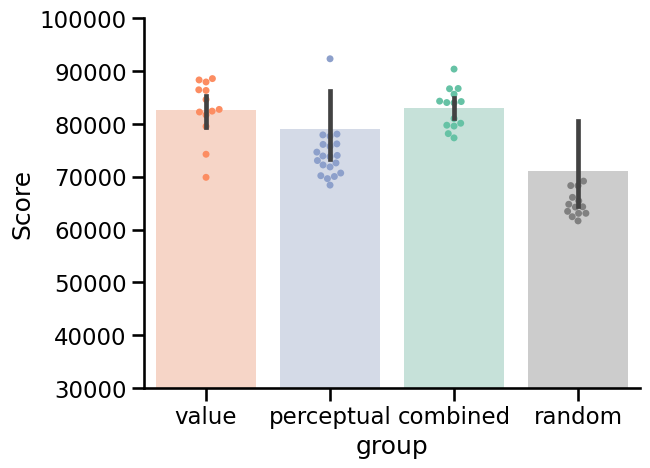

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns
# compute cumulative sum for session 3
df['obtained_outcome'] = (df['outcome1'] * df['choice'].eq(1)) + (df['outcome2'] * df['choice'].eq(2))
# if destroyed is 0, then the obtained outcome is /
df['obtained_outcome'] = df.apply(lambda x: x.obtained_outcome if x.destroyed else x.obtained_outcome/2, axis=1)



df2 = df[(df.session==3) & (df.choice != 0)].groupby(['prolificID', 'group'], as_index=False).sum(numeric_only=True)

sns.set_palette("Set2")
sns.set_context("talk")
sns.barplot(data=df2, x='group', y='obtained_outcome', order=['value', 'perceptual', 'combined', 'random'], palette=['C1', 'C2', 'C0', 'gray'], alpha=0.4, zorder=-1)
sns.swarmplot(data=df2, x='group', y='obtained_outcome', order=['value', 'perceptual', 'combined', 'random'], palette=['C1', 'C2', 'C0', 'gray'], alpha=1, zorder=1)
plt.ylabel('Score')
sns.despine()
plt.ylim(30000, 100000)

import scipy.stats as stats

# stats.ttest_ind(df2[df2.group=='value'].obtained_outcome, df2[df2.group=='perceptual'].obtained_outcome)
print(stats.ttest_ind(df2[df2.group=='value'].obtained_outcome, df2[df2.group=='random'].obtained_outcome))


In [43]:
def get_choice(row, kind='value'):
    if kind == 'perceptual':
        return 1 if row.p1 > row.p2 else 2
    if kind == 'value':
        return 1 if row.m1 > row.m2 else 2
    if kind == 'combined':
        return 1 if row.ev1 > row.ev2 else 2
    if kind == 'random':
        return 1 if np.random.random() > 0.5 else 2
def get_outcome(row, choice):
    p = row.p1 if choice == 1 else row.p2
    if np.random.random() > p:
        return row.outcome1/2 if choice == 1 else row.outcome2/2
    if (choice == 1):
        return row.outcome1
    return row.outcome2


ddf = df[df.session==3].copy()
ddf = ddf[ddf.choice!=0]
ddf['out_sim'] = df.apply(lambda x: get_outcome(x, get_choice(x, x.group)), axis=1)
ddf['out_perceptual'] = df.apply(lambda x: get_outcome(x, get_choice(x, 'perceptual')), axis=1)
ddf['out_value'] = df.apply(lambda x: get_outcome(x, get_choice(x, 'value')), axis=1)
ddf['out_combined'] = df.apply(lambda x: get_outcome(x, get_choice(x, 'combined')), axis=1)
ddf['out_random'] = df.apply(lambda x: get_outcome(x, get_choice(x, 'random')), axis=1)


# we want a df where group is the kind of choice and out_X is the obtained outcome "out"
# we take each column and stack it; using the name of the column as the value of the new column "kind"
# ddf = ddf[['out_perceptual', 'out_value', 'out_combined', 'out_random']].stack().reset_index()
# ddf.columns = ['id', 'kind', 'out']
# ddf['group'] = ddf['kind'].apply(lambda x: x.split('_')[1])


C:\Users\garciaba\AppData\Local\Temp\ipykernel_38500\3909425696.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=ddf, x='group', y='out_sim', order=['value', 'perceptual', 'combined', 'random'], palette=['C1', 'C2', 'C0', 'gray'], alpha=0.4, zorder=-1)
C:\Users\garciaba\AppData\Local\Temp\ipykernel_38500\3909425696.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.swarmplot(data=ddf, x='group', y='out_sim', order=['value', 'perceptual', 'combined', 'random'], palette=['C1', 'C2', 'C0', 'gray'], alpha=0.8, zorder=1)


(30000.0, 100000.0)

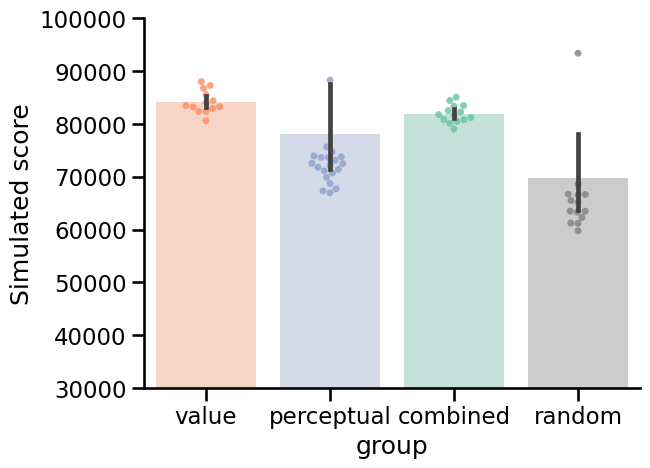

In [45]:
# create a df where out is the obtained outcome and group is the group
# sum for each group
ddf = ddf.groupby(['group', 'prolificID'], as_index=False).sum(numeric_only=True)

sns.barplot(data=ddf, x='group', y='out_sim', order=['value', 'perceptual', 'combined', 'random'], palette=['C1', 'C2', 'C0', 'gray'], alpha=0.4, zorder=-1)

sns.swarmplot(data=ddf, x='group', y='out_sim', order=['value', 'perceptual', 'combined', 'random'], palette=['C1', 'C2', 'C0', 'gray'], alpha=0.8, zorder=1)
sns.despine()
plt.ylabel('Simulated score')
plt.ylim(30000, 100000)

In [46]:
# ddf = ddf.groupby('prolificID', as_index=False).mean(numeric_only=True)
 # we want a df where group is the kind of choice and out_X is the obtained outcome "out"
# we take each column and stack it; using the name of the column as the value of the new column "kind"
ddf = ddf[['out_perceptual', 'out_value', 'out_combined', 'out_random']].stack().reset_index()
ddf.columns = ['id', 'kind', 'out']
ddf['group'] = ddf['kind'].apply(lambda x: x.split('_')[1])


C:\Users\garciaba\AppData\Local\Temp\ipykernel_38500\4075794637.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=ddf, x='group', y='out', order=['value', 'perceptual', 'combined', 'random'], palette=['C1', 'C2', 'C0', 'gray'], alpha=0.4, zorder=-1)
C:\Users\garciaba\AppData\Local\Temp\ipykernel_38500\4075794637.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.swarmplot(data=ddf, x='group', y='out', order=['value', 'perceptual', 'combined', 'random'], palette=['C1', 'C2', 'C0', 'gray'], alpha=0.8, zorder=1)
c:\Users\garciaba\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\seaborn\categorical.py:3399: UserWarning: 37.5% of the points cannot be placed; you may want to decrease the size 

TtestResult(statistic=5.196952127466022, pvalue=7.928437764745787e-07, df=126.0)


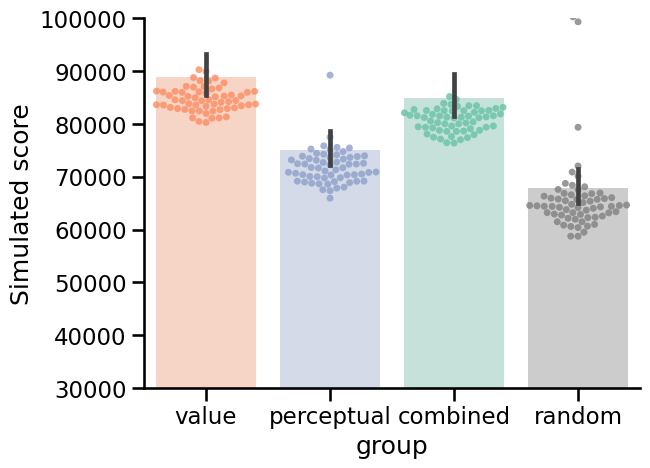

In [47]:

sns.barplot(data=ddf, x='group', y='out', order=['value', 'perceptual', 'combined', 'random'], palette=['C1', 'C2', 'C0', 'gray'], alpha=0.4, zorder=-1)

sns.swarmplot(data=ddf, x='group', y='out', order=['value', 'perceptual', 'combined', 'random'], palette=['C1', 'C2', 'C0', 'gray'], alpha=0.8, zorder=1)
sns.despine()
plt.ylim(30000, 100000)
plt.ylabel('Simulated score')
import scipy.stats as stats
print(stats.ttest_ind(ddf[ddf.group=='value'].out, ddf[ddf.group=='perceptual'].out))



In [19]:
df_ = df.copy()
for pid in df.prolificID.unique():
    # print(pid)
    # check len of the two samples
    a = len(df[(df.prolificID==pid) & (df.session==1)].opti_ff)
    b = len(df[(df.prolificID==pid) & (df.session==2)].opti_ff)
    if a != b:
        # find max len
        max_len = max(a, b)
        # if b is smaller fill with np.nan
        # else resize a to max_len
        # print if a or b if longer
        print(pid, a, b)
        continue

    df_.loc[(df_.prolificID==pid) & (df_.session==2), 'opti_ff'] = df[(df.prolificID==pid) & (df.session==1)].opti_ff.values

df2 = df_.copy()
df2 = df2[df2.session==2]
print(df2.opti_ff.isna().sum())
def get_group(prolificID):
    opti_ff = df2[df2.prolificID==prolificID].opti_ff
    opti_ss = df2[df2.prolificID==prolificID].opti_ss
    p_ss = stats.ttest_1samp(opti_ss, 0.5, alternative='greater').pvalue < 0.05 
    p_ff = stats.ttest_1samp(opti_ff, 0.5, alternative='greater').pvalue < 0.05

    if p_ss and p_ff:
        return 'combined'
          
    if p_ff:
        return 'perceptual'
    
    if p_ss:
        return 'value'

    return 'random'

for pid in df.prolificID.unique():
    df_.loc[df_.prolificID==pid, 'group'] = get_group(pid)


# now compare the groups in df and df_
x = []
y = []
z = []
for pid in df.prolificID.unique():
    group = df[df.prolificID==pid].group.values[0]
    group_ = df_[df_.prolificID==pid].group.values[0]
    group__ = df__[df__.prolificID==pid].group.values[0]
    x.append(group_)
    y.append(group)
    z.append(group__)
    # if group != group_:
        # print(pid)

# for each pair of groups, count the number of 


6746499fde684b081912c056 48 77
6759bab1432aedd5f3c18487 47 48
6728e9f22f76d709508acf02 47 48
0


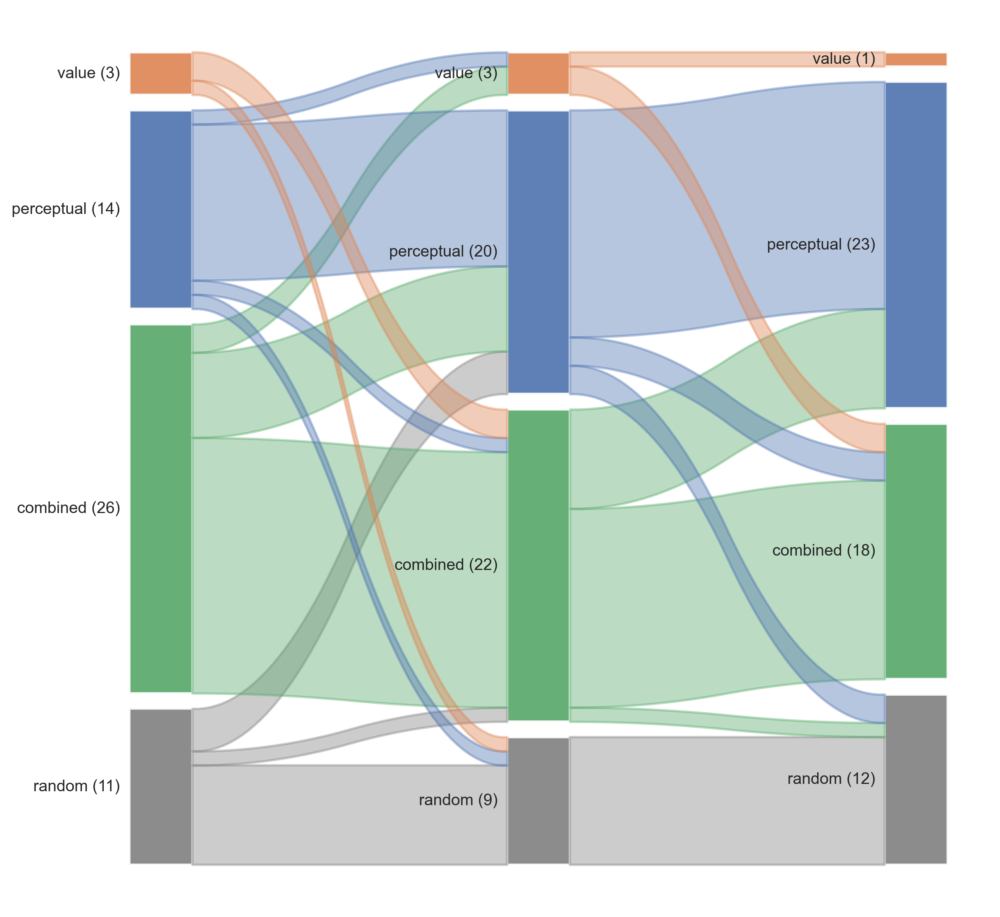

In [20]:
import matplotlib.pyplot as plt
import pandas as pd
import sys
sys.path.append('..')

from src.visualization.pysankey2.pysankey2 import Sankey

colorDict = {
    'value': 'C1',
    'perceptual': 'C0',
    'random': 'gray',
    'combined': 'C2'
}

df_sankey = pd.DataFrame({'layer1': x, 'layer2': y, 'layer3': z})
order = np.array(['value', 'perceptual', 'combined', 'random'])[::-1]
# set stripColor="left" 
sky = Sankey(df_sankey,colorDict=colorDict,stripColor='left', layerLabels=
             {'layer1': order, 'layer2': order, 'layer3': order})

# set a bigger font size 
fig,ax = sky.plot()

plt.savefig('sankey.png', dpi=300)



In [12]:
{i:j for i,j in df_sankey.layer1.value_counts().items()}

{'combined': 29, 'value': 16, 'random': 8, 'perceptual': 8}

[0.12, 0.18, 0.27, 0.38, 0.5, 0.62, 0.73, 0.82, 0.88]


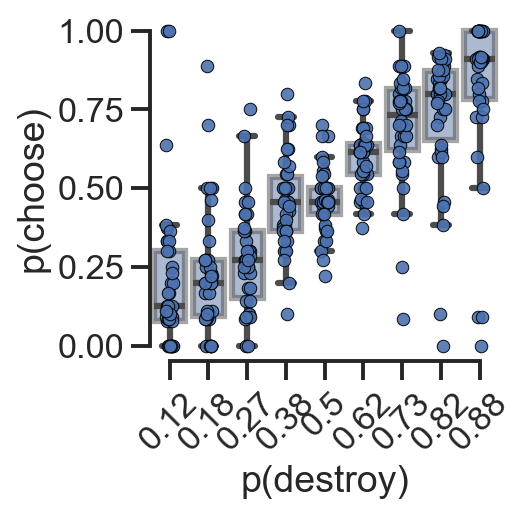

In [6]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# df = pd.read_csv('../data/raw/fullpilot10.csv')
dff = df[df.expName=='FullPilot14']
dff = dff[df.session.isin([1])]
dff = dff[dff.group!='random']

dff['id'] = df.prolificID
# plot y as choice frequency for each p
# plot x as p
# plot size as N (number of trials with p)
pp = np.unique(np.array([dff.p1.unique(), dff.p2.unique()]).flatten())
# mm = np.unique(np.array([df.m1.unique(), df.m2.unique()]).flatten())
# print(pp)
logit = lambda x: 1/(1+np.exp(-2*x))
print(logit(np.linspace(-1, 1, 9)).round(2).tolist())
# assert sorted(pp) == logit(np.linspace(-1, 1, 9)).round(2).tolist()
p_freq = []
m_freq = []
for pid in dff.id.unique():
    ddf = dff[(dff.id == pid)]
    for p1 in pp:
        n_p1 = ((ddf.p1 == p1) | (ddf.p2 == p1)).sum()
        p_freq.append(
            {
             'id': pid,
             'p': p1,
             'choice_freq_p': ((ddf.p1 == p1) & (ddf.choice == 1) | (ddf.p2 == p1) & (ddf.choice == 2)).sum() / n_p1,
             'N_p': n_p1,
             'correct_p': ((ddf.p1 == p1) & (ddf.choice == 1)  & (ddf.p1 > ddf.p2) | (ddf.p2 == p1) & (ddf.choice == 2) & (ddf.p2 > ddf.p1)).sum() / n_p1,
            }
        )


p_freq = pd.DataFrame(p_freq)
m_freq = pd.DataFrame(m_freq)

# plt.figure(figsize=(5, 4), dpi=150)
sns.set(rc={'figure.figsize':(6, 6), 'figure.dpi':150})
sns.set(rc={'figure.figsize':(3, 3), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
sns.boxplot(x='p', y='choice_freq_p', data=p_freq, showfliers=False, boxprops=dict(alpha=0.5), zorder=-1, color='C0', linewidth=3)   

sns.stripplot(x='p', y='choice_freq_p',data=p_freq, alpha=0.9, size=6, zorder=1, edgecolor='black', linewidth=0.5, color="C0")

# plot identity line
# plt.plot([0, len(pp)], [0, 1], color='black', linestyle='--', zorder=-10, alpha=0.8)
sns.despine(trim=True)
plt.ylabel('p(choose)')
plt.xlabel('p(destroy)')
plt.tick_params(axis='x', rotation=45)
# slides.add('bw.pptx')
# plot text for N on top of bars


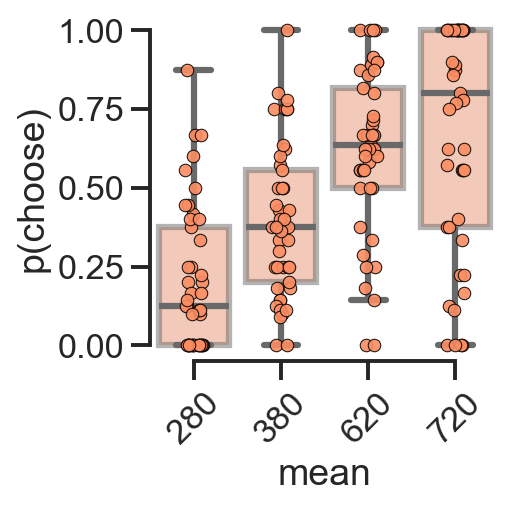

In [ ]:
import matplotlib.pyplot as plt

session = [2]
df['id'] = df.prolificID
dff = df[df.expName=='FullPilot14'].copy()
dff = dff[dff.t > 30]
dff = dff[dff.session.isin(session)]    
dff = dff[dff.group!='random']

mm = np.unique(np.array([dff.m1.unique(), dff.m2.unique()]).flatten())
p_freq = []
m_freq = []
for pid in dff.id.unique():
    ddf = dff[(dff.id == pid)]
    
    for m in mm:
        n_m = ((ddf.m1 == m) | (ddf.m2 == m)).sum()
        m_freq.append(
            {
              'id': pid,
             'm': m,
             'choice_freq_m': ((ddf.m1 == m) & (ddf.choice == 1) | (ddf.m2 == m) & (ddf.choice == 2)).sum() / n_m,
             'N_m': n_m,
             'correct_m': ((ddf.m1 == m) & (ddf.choice == 1)  & (ddf.m1 > ddf.m2) | (ddf.m2 == m) & (ddf.choice == 2) & (ddf.m2 > ddf.m1)).sum() / n_m,
            }
        ) 

p_freq = pd.DataFrame(p_freq)
m_freq = pd.DataFrame(m_freq)

# plt.figure(figsize=(5, 4), dpi=150)
sns.set(rc={'figure.figsize':(3, 3), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
sns.set_palette('Set2')
sns.boxplot(x='m', y='choice_freq_m', data=m_freq, showfliers=False, color='C1', boxprops=dict(alpha=0.5), zorder=-1, linewidth=3)   

sns.stripplot(x='m', y='choice_freq_m',data=m_freq, alpha=0.9, size=6, zorder=1, edgecolor='black', linewidth=0.5, color="C1")

# plot identity line
# plt.plot([0, len(pp)], [0, 1], color='black', linestyle='--', zorder=-10, alpha=0.8)
sns.despine(trim=True)
plt.ylabel('p(choose)')
plt.xlabel('mean')
plt.tick_params(axis='x', rotation=45)
# slides.add('bw.pptx')

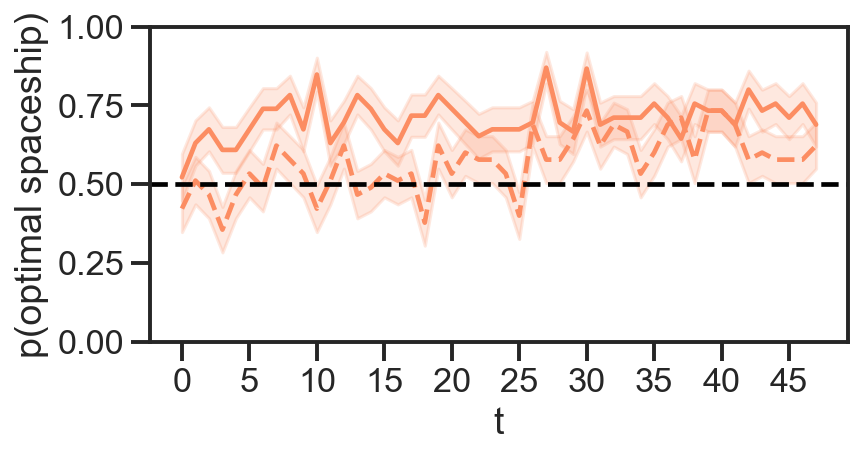

In [ ]:
import matplotlib.pyplot as plt
sns.set(rc={'figure.figsize':(6, 6), 'figure.dpi':150})

sns.set_palette('Set2')
sns.set_style('ticks')
sns.set_context('talk')

expName = 'FullPilot14'

plt.subplot(2, 1, 1)
sns.lineplot(x='t', y='opti_ss', data=df[df.session.isin([0,2]) & (df.group!='random')], hue="session",  errorbar=('se'), palette=['C1', 'C1'])

# set linestyle on second line to dashed
plt.gca().get_lines()[0].set_linestyle("--")
# smooth line with 
plt.axhline(y=0.5, color='black', linestyle='--')
plt.ylabel('p(optimal spaceship)')
# plt.ylim(0,1)
# set x ticks to 72
plt.xticks(np.arange(0, 48, 5))
plt.ylim(0,1)
#get labels and handles
handles, labels = plt.gca().get_legend_handles_labels()

# plt.legend(title='training', labels=['1', '2'], handles=handles[[2, 3]], loc='upper left')
plt.legend().remove()

(0.0, 1.0)

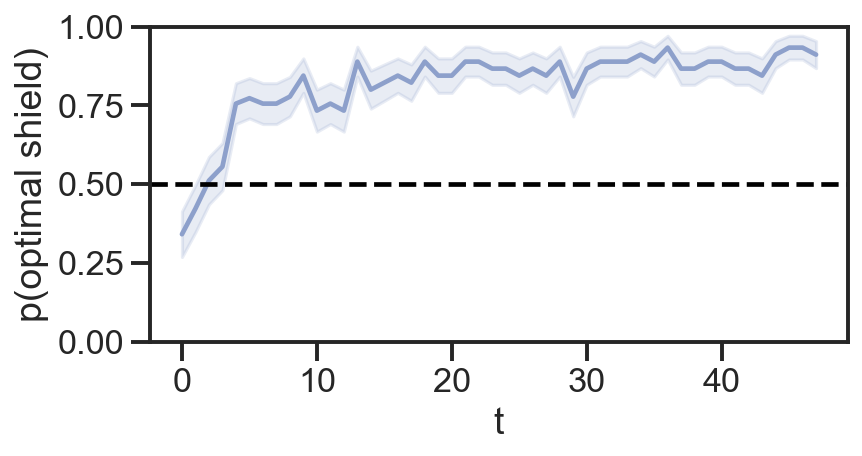

In [ ]:
sns.set(rc={'figure.figsize':(6, 6), 'figure.dpi':150}) 
sns.set_palette('Set2')
sns.set_style('ticks') 
sns.set_context('talk')
plt.subplot(2, 1, 1)
ddf = df[df.group!='random']
sns.lineplot(x='t', y='opti_ff', data=df[(df.session==1) & (df.group!='random')], color='C2', errorbar=('se'))
plt.axhline(y=0.5, color='black', linestyle='--')
plt.ylabel('p(optimal shield)')
plt.ylim(0,1)


# now plot means for opti_ff


session
0    0.568519
1    0.817957
2    0.714448
Name: opti, dtype: float64


C:\Users\garciaba\AppData\Local\Temp\ipykernel_37184\32151198.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='session', y='opti', data=ddf, showfliers=False, boxprops=dict(alpha=0.5), zorder=-1, linewidth=3, palette=['C1', 'C2', 'C1'], meanline=True)
C:\Users\garciaba\AppData\Local\Temp\ipykernel_37184\32151198.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='session', y='opti', data=ddf, alpha=0.9, size=8, zorder=1, edgecolor='black', linewidth=0.5, palette=['C1', 'C2', 'C1'])


(-0.1, 1.1)

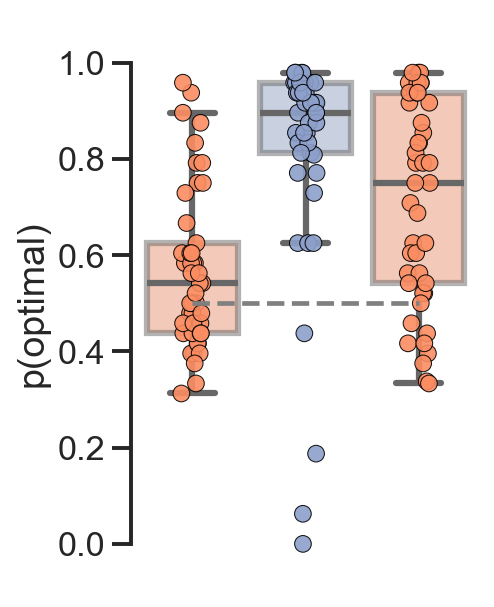

In [ ]:
# compare opti_ss mean in session 2 to opti_ff_mean in session 2

sns.set(rc={'figure.figsize':(3, 5), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
sns.set_palette('Set2')
import matplotlib.pyplot as plt

ddf = df.copy()
ddf = ddf[ddf.group!='random']
ddf = ddf[ddf.session.isin([0,1, 2])]
ddf = ddf[ddf.expName.isin(['FullPilot14'])]

# ddf['exp'] = 1
# ddf['opti'] = np.nan
# ddf = ddf[ddf.group!='random']  
# create a new dataframe with id, opti_ss, opti_ff, session
ddf.loc[ddf.session.isin([0,2]), 'opti'] = ddf[ddf.session.isin([0,2])].opti_ss
ddf.loc[ddf.session == 1, 'opti'] = ddf[ddf.session == 1].opti_ff

# session 0 and 2 becomes session 0 with average of opti 0 and 2
# def average_opti(x):
    # for each t and prolificID, return the mean of opti
    # return np.mean(ddf[(ddf.session.isin([0, 2])) & (ddf.prolificID == x.prolificID) & (ddf.t == x.t)].opti)

# ddf['opti'] = ddf.apply(lambda x: average_opti(x) if x.session in [0, 1, 2] else x.opti, axis=1)

# now drop session 2
# ddf = ddf[ddf.session != 2]




ddf = ddf.groupby(['prolificID', 'session'], as_index=False).opti.mean()
# ddf = ddf[ddf.group!='random']
print(ddf.groupby('session').opti.mean())

sns.boxplot(x='session', y='opti', data=ddf, showfliers=False, boxprops=dict(alpha=0.5), zorder=-1, linewidth=3, palette=['C1', 'C2', 'C1'], meanline=True)
sns.stripplot(x='session', y='opti', data=ddf, alpha=0.9, size=8, zorder=1, edgecolor='black', linewidth=0.5, palette=['C1', 'C2', 'C1'])
plt.ylabel('p(optimal)')
plt.plot([0, 2], [0.5, 0.5], color='grey', linestyle='--')
sns.despine(trim=True, bottom=True)
plt.ylim(0, 1)
plt.yticks(np.linspace(0, 1, 6))
plt.xlabel('')
plt.xticks([])
plt.ylim(-.1, 1.1)


In [389]:

means_ss1 = df_[df_.session==1].groupby('prolificID').opti_ff.mean()
means_ss2 = df_[df_.session==2].groupby('prolificID').opti_ss.mean()

# check that prolificIDs are ordered the same
assert (means_ss1.index == means_ss2.index).all()

# make two columns with the means
a = np.array([means_ss1.index.values, means_ss2.index.values]).T
a

array([['5484d361fdf99b0379939d5b', '5484d361fdf99b0379939d5b'],
       ['58c42d725866f200017c5deb', '58c42d725866f200017c5deb'],
       ['5a580fb6eedc320001426cd7', '5a580fb6eedc320001426cd7'],
       ['5a9416ba6475f900019fa690', '5a9416ba6475f900019fa690'],
       ['5ac560359534ba0001c74715', '5ac560359534ba0001c74715'],
       ['5d012b5ffade220017b10010', '5d012b5ffade220017b10010'],
       ['5d44afdcad6d110019b0a960', '5d44afdcad6d110019b0a960'],
       ['5d5b67ab9ad5a300181398dc', '5d5b67ab9ad5a300181398dc'],
       ['5d773df22fa4bf001a045aa9', '5d773df22fa4bf001a045aa9'],
       ['5d9cb58ee8783f0019c8bd06', '5d9cb58ee8783f0019c8bd06'],
       ['5da4152a3ab39a0011295a3e', '5da4152a3ab39a0011295a3e'],
       ['5ee738a018d5a84caa7e0f2a', '5ee738a018d5a84caa7e0f2a'],
       ['6087ee3e8df094dc6dd69e8e', '6087ee3e8df094dc6dd69e8e'],
       ['60d7922fc3809c404939251c', '60d7922fc3809c404939251c'],
       ['60da2baf34bde948982f84db', '60da2baf34bde948982f84db'],
       ['610a1655e385fd73

C:\Users\garciaba\AppData\Local\Temp\ipykernel_37184\2278469714.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_ = df_[df.t>28]


SignificanceResult(statistic=0.18429212205475876, pvalue=0.2255531736828868)


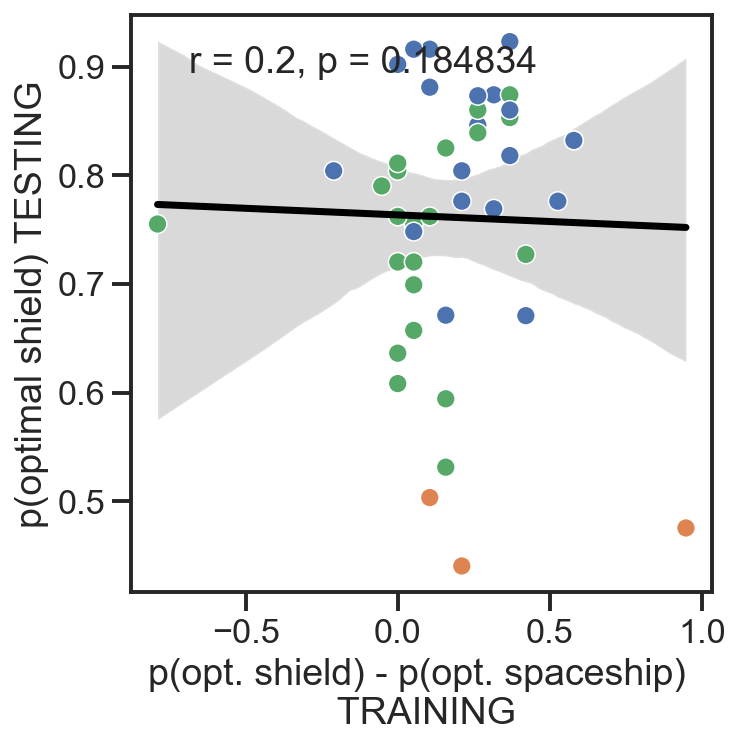

In [ ]:
# correlation between opti_ss in session 2 and 3
df_ = df[df.expName.isin(['FullPilot14'])]
df_ = df_[df_.group != 'random']
df_ = df_[df.t>28]

means_ss1 = df_[df_.session==1].groupby('prolificID').opti_ff.mean()
means_ss2 = df_[df_.session==2].groupby('prolificID').opti_ss.mean()
means_ss1 = means_ss1-means_ss2

means_ss2 = df_[df_.session==3].groupby('prolificID').opti_ff.mean() 

import scipy.stats as stats

print(stats.spearmanr(means_ss1, means_ss2))
sns.set(rc={'figure.figsize':(5, 5), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
means_ss2 = means_ss2[(means_ss1 > -0.8)]
means_ss1 = means_ss1[(means_ss1 > -0.8)] 
sns.regplot(x=means_ss1, y=means_ss2, scatter=False, color='black')
# create a df with means_ss1, means_ss2, group
ddf = pd.DataFrame({'means_ss1': means_ss1, 'means_ss2': means_ss2, 'group': df_[df_.session==1].groupby('prolificID').group.first()})
sns.scatterplot(x='means_ss1', y='means_ss2', alpha=1, hue='group', data=ddf, palette=['C0', 'C1', 'C2'], hue_order=['perceptual', 'value', 'combined'])
plt.xlabel('p(opt. shield) - p(opt. spaceship) \n TRAINING')
plt.ylabel('p(optimal shield) TESTING')

import statsmodels.api as sm

X = sm.add_constant(means_ss1)
model = sm.OLS(means_ss2, X)
results = model.fit()
results.summary()

# display pearson correlation in the plot
r,p = stats.spearmanr(means_ss1, means_ss2)
plt.text(0.1, 0.9, f'r = {r.round(2)}, p = {p.round(6)}', transform=plt.gca().transAxes)

plt.legend().remove()

PearsonRResult(statistic=0.17249447086754618, pvalue=0.22611943391194284)


Text(0.1, 0.9, 'r = 0.17, p = 0.226119')

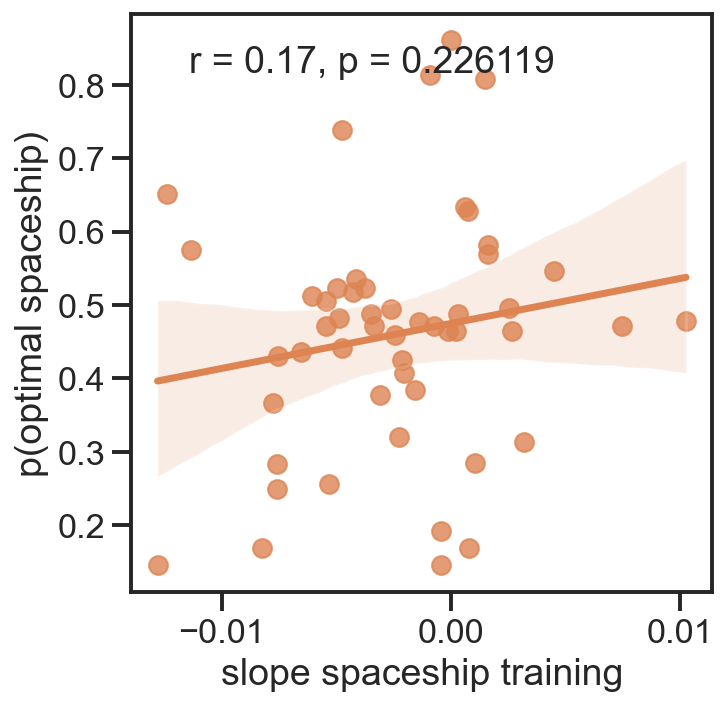

In [245]:
# correlation between opti_ss in session 2 and 3
df_ = df[df.expName.isin(['FullPilot12'])]
df_ = df_[df_.group != 'random']
means_ss1 = df_[df_.session==2].groupby('prolificID').opti_ss.mean()
means_ss2 = df_[df_.session==4].groupby('prolificID').opti_ss.mean()
means_ss1 = -new_df.slope_ss.values
import scipy.stats as stats

print(stats.pearsonr(means_ss1, means_ss2))
sns.set(rc={'figure.figsize':(5, 5), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
sns.regplot(x=means_ss1, y=means_ss2, color='C1')
plt.xlabel('slope spaceship training')
plt.ylabel('p(optimal spaceship)')

import statsmodels.api as sm

X = sm.add_constant(means_ss1)
model = sm.OLS(means_ss2, X)
results = model.fit()
results.summary()

# display pearson correlation in the plot
r,p = stats.pearsonr(means_ss1, means_ss2)
plt.text(0.1, 0.9, f'r = {r.round(2)}, p = {p.round(6)}', transform=plt.gca().transAxes)

PearsonRResult(statistic=0.1262262957749269, pvalue=0.4142373759947783)


C:\Users\garciaba\AppData\Local\Temp\ipykernel_37184\2427611725.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_ = df_[df.t>28]


Text(0.1, 0.9, 'r = 0.32, p = 0.035202')

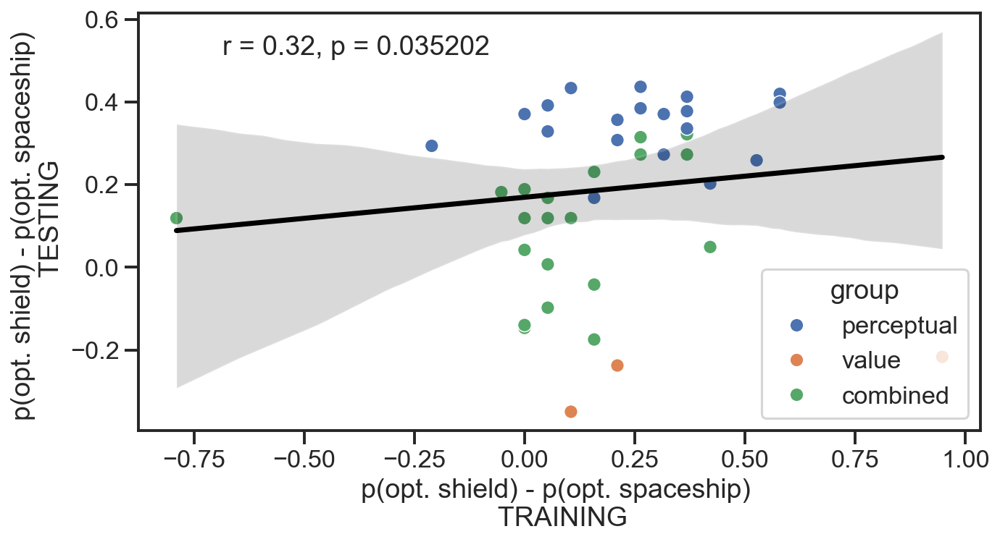

In [ ]:
# correlation between opti_ss in session 2 and 3
df_ = df[df.expName.isin(['FullPilot14'])]
df_ = df_[df_.group != 'random']
df_ = df_[df.t>28]
means_ss1 = df_[df_.session==1].groupby('prolificID').opti_ff.mean()
means_ss2 = df_[df_.session==2].groupby('prolificID').opti_ss.mean()

means_ss1 = means_ss1-means_ss2
means_ss2 = df_[df_.session==3].groupby('prolificID').opti_ff.mean() - df_[df_.session==3].groupby('prolificID').opti_ss.mean()

import scipy.stats as stats
means_ss2 = means_ss2[(means_ss1 > -0.8)]

means_ss1 = means_ss1[(means_ss1 > -0.8)]
print(stats.pearsonr(means_ss1, means_ss2))
sns.set(rc={'figure.figsize':(10, 5), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
ndf = []

for pid in means_ss1.index:
    ndf.append({'prolificID': pid, 'training': means_ss1[pid], 'testing': means_ss2[pid], 'group': df[df.prolificID == pid].group.values[0]})
ndf = pd.DataFrame(ndf)
# sns.regplot(x='training',y='testing', data=ndf)
sns.scatterplot(x='training',y='testing', data=ndf, hue='group', hue_order=['perceptual', 'value', 'combined'], palette=['C0', 'C1', 'C2'])
# plot regression line in black
sns.regplot(x='training',y='testing', data=ndf, scatter=False, color='black')

plt.xlabel('p(opt. shield) - p(opt. spaceship) \n TRAINING')
plt.ylabel('p(opt. shield) - p(opt. spaceship) \n TESTING')

import statsmodels.api as sm

X = sm.add_constant(means_ss1)
model = sm.OLS(means_ss2, X)
results = model.fit()
results.summary()

# display pearson correlation in the plot
r,p = stats.spearmanr(means_ss1, means_ss2)
plt.text(0.1, 0.9, f'r = {r.round(2)}, p = {p.round(6)}', transform=plt.gca().transAxes)

In [323]:
means_ss1

prolificID
5484d361fdf99b0379939d5b   -0.105263
58c42d725866f200017c5deb    0.000000
5a580fb6eedc320001426cd7    0.684211
5a9416ba6475f900019fa690    0.052632
5ac560359534ba0001c74715   -0.105263
5d012b5ffade220017b10010   -0.315789
5d44afdcad6d110019b0a960   -0.105263
5d5b67ab9ad5a300181398dc    0.105263
5d773df22fa4bf001a045aa9   -0.210526
5d9cb58ee8783f0019c8bd06   -0.210526
5da4152a3ab39a0011295a3e   -0.315789
5ee738a018d5a84caa7e0f2a    0.052632
6087ee3e8df094dc6dd69e8e   -0.052632
60d7922fc3809c404939251c   -0.526316
60da2baf34bde948982f84db   -0.052632
610a1655e385fd7341e12778   -0.368421
61363ce02e6022a741d63a6e    0.000000
6150fb8383f88eae3e5c795a   -0.157895
6167175ed1680ecefc063aed    0.157895
62865e3456c142785cfad2a7   -0.631579
632fc453431e3369da22be81   -0.526316
657b6239aa8091bfa2b24ae0   -0.315789
65e0ef2a74037d1530a40cca   -0.526316
660c9c26e4220931438f3d30    0.105263
66182d2b06cbee83d298b517   -0.105263
663784abc88d62265def75ea    0.684211
663a623d4ea504f754d08b02   

Text(0.1, 0.9, 'r = 0.02, p = 0.889573')

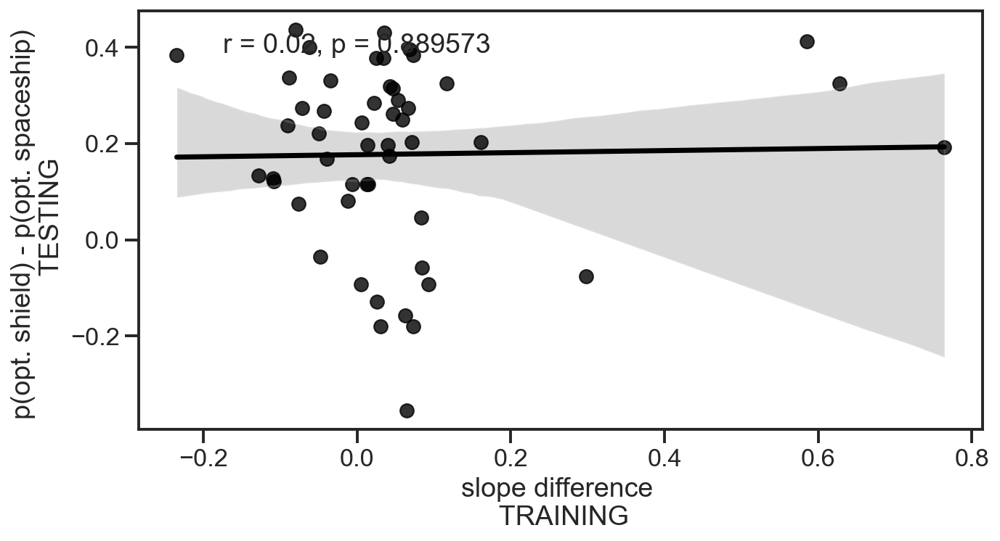

In [302]:
# fit expnoential function to each participant
from scipy import odr

df_ = df[df.expName.isin(['FullPilot12'])]
df_ = df_[df_.group != 'random']
new_df = []

for pid in df_.prolificID.unique():

    x = df_[(df_.prolificID == pid) & (df_.session==2)].t
    y = df_[(df_.prolificID == pid) & (df_.session==2)].fireTime
    data = odr.Data(x, y)
    odr_obj = odr.ODR(data, odr.exponential)
    output1 = odr_obj.run()

    x = df_[(df_.prolificID == pid) & (df_.session==1)].t
    y = df_[(df_.prolificID == pid) & (df_.session==1)].fireTime
    data = odr.Data(x, y)
    odr_obj = odr.ODR(data, odr.exponential)
    output2 = odr_obj.run()

    new_df.append({
        'prolificID': pid,
        'expName': df[df.prolificID == pid].expName.unique()[0],
        'intercept_ss': output1.beta[0],
        'slope_ss': output1.beta[1],
        'intercept_ff': output2.beta[0],
        'slope_ff': output2.beta[1]
    })

pd.DataFrame(new_df).to_csv('../data/processed/exp_fit_training.csv', index=False)

new_df = pd.DataFrame(new_df)

import statsmodels.api as sm

means_ss1 = new_df.slope_ff - new_df.slope_ss
slope_diff = new_df.slope_ff - new_df.slope_ss
means_ss2 = df_[df_.session==3].groupby('prolificID').opti_ff.mean() - df_[df_.session==3].groupby('prolificID').opti_ss.mean()
X = sm.add_constant(means_ss1)
model = sm.OLS(means_ss2.values, X)
results = model.fit()
results.summary()

sns.set(rc={'figure.figsize':(10, 5), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
sns.regplot(x=means_ss1, y=means_ss2, color='black')
plt.xlabel('slope difference \n TRAINING')
plt.ylabel('p(opt. shield) - p(opt. spaceship) \n TESTING')

# display pearson correlation in the plot
r,p = stats.pearsonr(means_ss1, means_ss2)
plt.text(0.1, 0.9, f'r = {r.round(2)}, p = {p.round(6)}', transform=plt.gca().transAxes)


In [301]:
df.columns

Index(['prolificID', 'expName', 'session', 't', 'pair', 'choice', 'outcome1',
       'outcome2', 'choseLeft', 'op1IsLeft', 'moveTime', 'fireTime',
       'leftCount', 'rightCount', 'ev1', 'ev2', 'p1', 'p2', 'm1', 'm2',
       'name1', 'name2', 'destroyed', 'score', 'datetime', 'opti_ss',
       'opti_ff', 'opti_ev', 'group'],
      dtype='object')

AttributeError: 'DataFrame' object has no attribute 'intercept_ss'

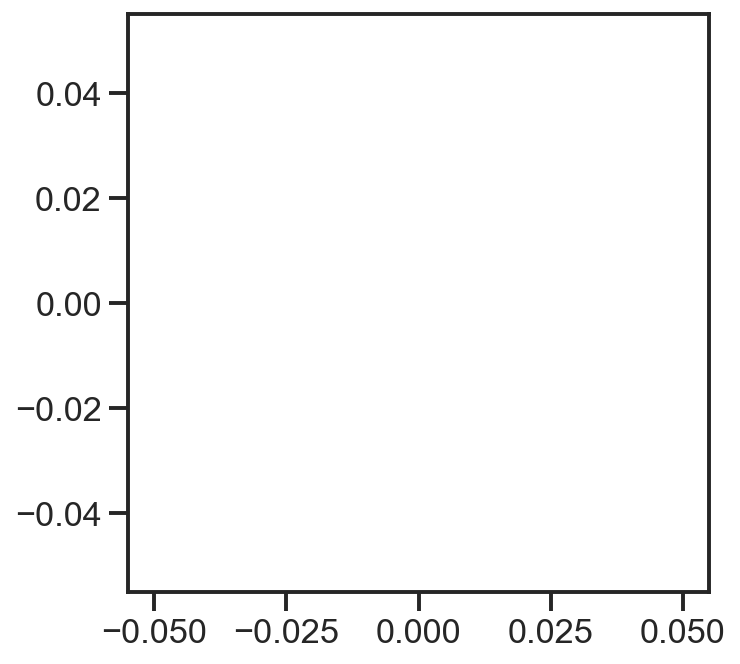

In [316]:
# select a random participant and display the fit
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

part = new_df.sample(1).prolificID.values[0]

f = lambda x, a, b: a + np.exp(b * x)

x = df_[(df_.prolificID == part) & (df_.session==2)].t
y = df_[(df_.prolificID == part) & (df_.session==2)].fireTime

plt.plot(x, y, 'o')
# sns.lineplot(x='t', y='fireTime', data=df_[(df_.session==0)])
plt.plot(x, f(x, new_df[new_df.prolificID == part].intercept_ss.values[0], new_df[new_df.prolificID == part].slope_ss.values[0]))

In [60]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import mnlogit

df_ = df[df.expName.isin(['FullPilot12'])]
df_ = df_[df_.group != 'random']

# slope = new_df.copy()
# create a table with the mean of opti_ss and opti_ff for each session + group of the participant
new_df = []

for pid in df_.prolificID.unique():
    new_df.append(
        {
            'prolificID': pid,
            'delta': df_[(df_.prolificID == pid) & (df_.session.isin([1]))].opti_ff.mean() - df_[(df_.prolificID == pid) & (df_.session.isin([2]))].opti_ss.mean(),#,slope[slope.prolificID==pid].slope_ff - slope[slope.prolificID==pid].slope_ss).values[0], #
            'group': df_[df_.prolificID == pid].group.iloc[0],
            'opti_ss': df_[(df_.prolificID == pid) & (df_.session.isin([2]))].opti_ss.mean(),
            'opti_ff': df_[(df_.prolificID == pid) & (df_.session.isin([1]))].opti_ff.mean()
        }
    )

new_df = pd.DataFrame(new_df)


# X = sm.add_constant(new_df[['opti_ss', 'opti_ff']])

map = {
    'value': 1,
    'perceptual': 2,
    'combined': 0,
}

new_df['group'] =  new_df['group'].map(map)
# map also prolificID to integers
new_df['prolificID'] = new_df['prolificID'].astype('category').cat.codes


# Multinomial logistic regression
model = mnlogit('group ~ opti_ff * opti_ss', data=new_df).fit()

# Summary of the model
print(model.summary())

# Predicted probabilities
# predictions = model.predict(X)
# print("Predicted probabilities:\n", predictions)


Optimization terminated successfully.
         Current function value: 0.764914
         Iterations 7
                          MNLogit Regression Results                          
Dep. Variable:                  group   No. Observations:                   51
Model:                        MNLogit   Df Residuals:                       43
Method:                           MLE   Df Model:                            6
Date:                Wed, 27 Nov 2024   Pseudo R-squ.:                  0.1639
Time:                        17:39:39   Log-Likelihood:                -39.011
converged:                       True   LL-Null:                       -46.660
Covariance Type:            nonrobust   LLR p-value:                   0.01806
        group=1       coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          -6.9975     15.618     -0.448      0.654     -37.609      23.614
opti_ff       

In [264]:
new_df

,prolificID,delta,group
0,15,-0.006806,2
1,47,-0.003666,2
2,31,0.000830,0
3,34,0.002688,0
4,13,-0.013433,2
5,7,0.004749,2
6,48,0.010806,2
7,44,-0.008950,2
8,18,0.011516,2
9,38,-0.002362,2


TtestResult(statistic=11.239190991927781, pvalue=8.028832935504602e-13, df=33.0)


C:\Users\garciaba\AppData\Local\Temp\ipykernel_18548\2079948928.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='group', y='delta', data=new_df,


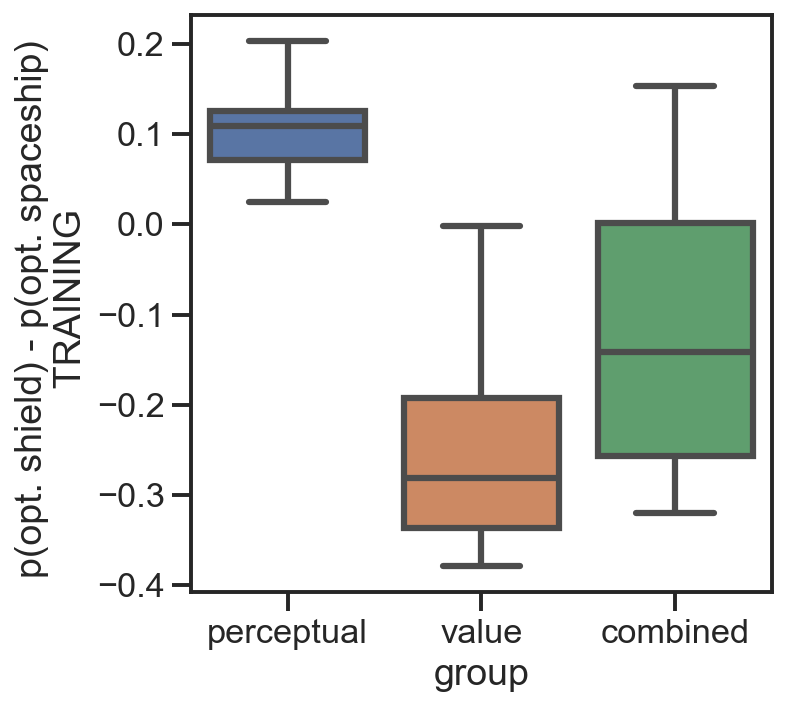

In [458]:
# remap = {
#     1: 'value',
#     2: 'perceptual',
#     0: 'combined'
# }
# new_df['group'] = new_df['group'].map(remap)
# sns.scatterplot(x='delta', y='group', data=new_df)
sns.set(rc={'figure.figsize':(5, 5), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
new_df = df.copy()
new_df = new_df[new_df.group != 'random']
new_df = new_df.groupby('prolificID').mean(numeric_only=True)
# reset group
map = df_.groupby('prolificID').group.first().to_dict()
new_df['group'] = new_df.index.map(map)
new_df['delta'] = new_df.opti_ff - new_df.opti_ss
sns.boxplot(x='group', y='delta', data=new_df, 
            showfliers=False, zorder=-1, linewidth=3,  order=['perceptual', 'value', 'combined'], palette=['C0', 'C1', 'C2'], meanline=True) 
plt.ylabel('p(opt. shield) - p(opt. spaceship) \n TRAINING')
# ttest between perceptual and value
import scipy.stats as stats
perceptual = new_df[new_df.group == 'perceptual'].delta
value = new_df[new_df.group == 'value'].delta

print(stats.ttest_ind(perceptual, value))

In [17]:

df[(df.session==0) & (df.m1==720)].name1.unique()

array(['FractureShip3_ 1'], dtype=object)

C:\Users\garciaba\AppData\Local\Temp\ipykernel_23984\289003827.py:57: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df_, x='opti_ss', y='opti_ff', alpha=0.2, fill=True, palette=['C0', 'C2', 'C1', 'C7'], hue='group', levels=2, bw_adjust=0.6, thresh=0.001)


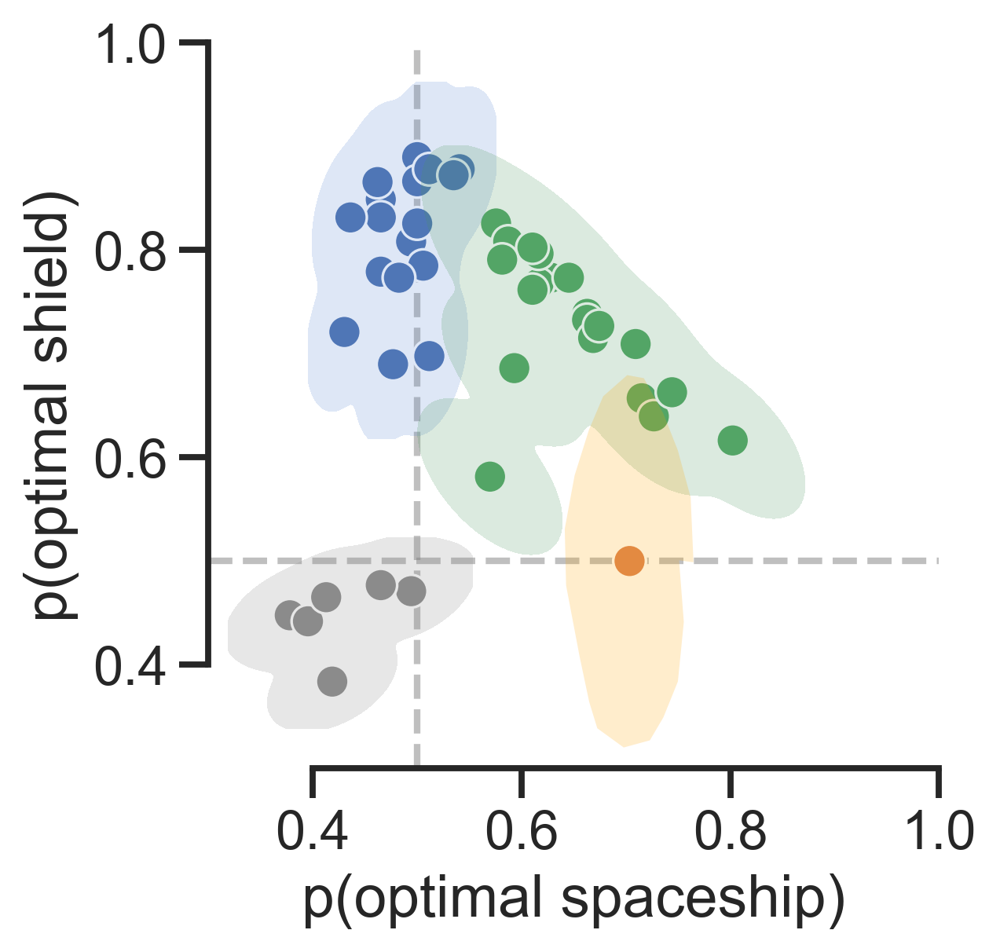

In [19]:
# same but with scatterplot

import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal

# Function to create hand-drawn-like regions
def draw_handdrawn_region(center, hue, ax, radius=0.12, irregularity=0.004):
    # Generate random points around the center
    center = (center[0].mean(), center[1].mean())

    angles = np.linspace(0, 2 * np.pi, 20)
    # make it elliptical
    radius_x = radius - (radius/2)
    radius_y = radius + (radius/2)
    x_offsets = radius_x * np.cos(angles) + np.random.randn(20) * irregularity
    y_offsets = radius_y * np.sin(angles) + np.random.randn(20) * irregularity
    region_x = center[0] + x_offsets
    region_y = center[1] + y_offsets
    
    # clip the region to the axes boundaries in order to get oval shapes instead of circles
    # use max to cut off like 30% of the region

    # Fill the hand-drawn region with alpha
    ax.fill(region_x, region_y, color=hue, alpha=0.2, linewidth=0, zorder=2)

def draw_contour_region(center, hue, ax, radius=0.07):
    # Create a grid of points around the center
    x = np.linspace(center[0] - radius, center[0] + radius, 100)
    y = np.linspace(center[1] - radius, center[1] + radius, 100)
    X, Y = np.meshgrid(x, y)
    
    # Create a multivariate normal distribution for contour
    pos = np.dstack((X, Y))
    rv = multivariate_normal([center[0], center[1]], [[radius, 0], [0, radius]])
    Z = rv.pdf(pos)
    
    # Plot contourf for filled contours
    ax.contourf(X, Y, Z, levels=2, colors=hue, alpha=0.2)


df_ = df[(df.expName=='FullPilot14') & (df.session==3)].groupby(['prolificID', 'group'], as_index=False).mean(numeric_only=True)
df_ = df_[df_.choice!=0]

sns.set(rc={'figure.figsize':(4,4), 'figure.dpi': 300})
sns.set_context("talk")
sns.set_style("ticks")


# sort by group 
order = ['perceptual', 'combined', 'value', 'random']
df_['group'] = pd.Categorical(df_['group'], categories=order, ordered=True)
scatter = sns.scatterplot(data=df_, x='opti_ss', y='opti_ff', hue='group', palette=['C0', 'C2', 'C1', 'C7'], s=100)


# using seaborn, we want a region of interest using the colors of the clusters in scatterplot

sns.kdeplot(data=df_, x='opti_ss', y='opti_ff', alpha=0.2, fill=True, palette=['C0', 'C2', 'C1', 'C7'], hue='group', levels=2, bw_adjust=0.6, thresh=0.001) 
# Draw kdeplot for clusters with sufficient points


data = df_
data['hue'] = data['group']
data['x'] = data['opti_ss']
data['y'] = data['opti_ff']
for hue_value in data['hue'].unique():
    
    subset = data[data['hue'] == hue_value]
    # For small groups, draw manual circles
    if len(subset) <= 2:
             # For small groups, draw hand-drawn regions
        draw_handdrawn_region((subset['x'], subset['y']), 'orange', plt.gca())
            


# add a third dimension (opti_ev)
plt.ylim(0.3, 1)
plt.xlim(0.3, 1)

# add identity line (x=y)
# plt.plot([0.3, 1], [0.3, 1], color='grey', lw=2, zorder=-100, alpha=0.5)

# add 0.5 line v and h
plt.axhline(0.5, color='grey', lw=2, ls='--', alpha=0.5, zorder=-100)
plt.axvline(0.5, color='grey', lw=2, ls='--', alpha=0.5 , zorder=-100)

plt.xlabel('p(optimal spaceship)')
plt.ylabel('p(optimal shield)')
# put legend outside
N = len(data)
# plt.title(f'counterfactual+R/2; N={N}')
sns.despine(trim=True)
#no legend
# plt.legend().remove()

#
# use order for legend
handles, labels = plt.gca().get_legend_handles_labels()
labels = ['perceptual', 'value', 'combined', 'random']
handles = [handles[order.index(label)] for label in labels]
labels = [f'{label} ({len(df_[df_.group==label])})' for label in labels]
plt.legend(title='', bbox_to_anchor=(1.05, 1), labels=labels, handles=handles,
           loc=2, borderaxespad=0.)

# legend order
plt.legend().remove()

perceptual 432
balanced 0
value 0
random 720
['perceptual', 'random']
['C0', 'C7']


C:\Users\basil\AppData\Local\Temp\ipykernel_24396\2015027913.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_, x='group', y='moveTime', palette=colors, order=order)
C:\Users\basil\AppData\Local\Temp\ipykernel_24396\2015027913.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_, x='group', y='fireTime', palette=colors, order=order)


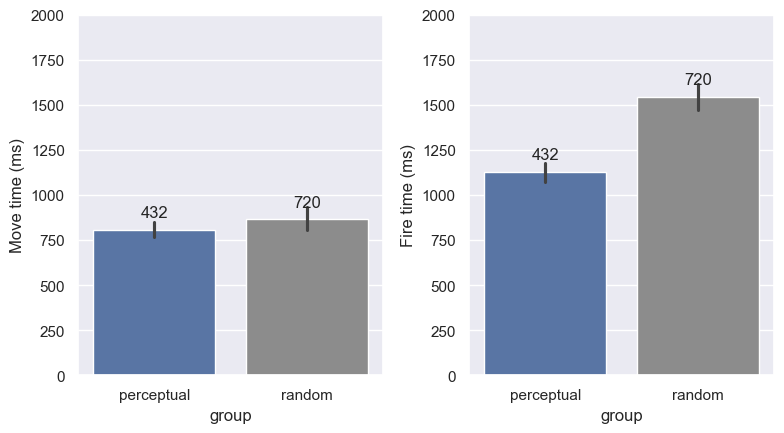

In [38]:
# plot reaction times for each group
#fireTime
sns.set(rc={'figure.figsize':(8,4.5)})
import matplotlib.pyplot as plt


# df_ = df[(df.expName=='FullPilot9') & (df.start_with_rl==0) & (df.session==2)]
df_ = df[(df.expName.isin(expName)) & (df.session==session)]
# df_ = df[]
order_ = ['perceptual', 'balanced', 'value', 'random']
colors_ = ['C0', 'C2', 'C1', 'C7']
order = []
colors = []
# if some group have no participant, pop it from order
for i, o in enumerate(order_):
    N = df_[df_.group==o].shape[0]
    print(o, N)
    # print(o, N)
    if N != 0:
        order.append(o)
        colors.append(colors_[i])

print(order)
print(colors)

plt.subplot(1, 2, 1)
sns.barplot(data=df_, x='group', y='moveTime', palette=colors, order=order)
# plot each N for each bar

for i, bar in enumerate(plt.gca().patches):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 70, df_[df_.group==order[i]].shape[0], ha='center')
# sns.stripplot(data=df, x='group', y='moveTime', palette=['C0', 'C1', 'C2'], alpha=.5)
plt.ylabel('Move time (ms)')
plt.ylim(0, 2000)
plt.subplot(1, 2, 2)
sns.barplot(data=df_, x='group', y='fireTime', palette=colors, order=order)
for i, bar in enumerate(plt.gca().patches):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 70, df_[df_.group==order[i]].shape[0], ha='center')
plt.ylabel('Fire time (ms)')

plt.ylim(0, 2000)
# plt.suptitle('current', fontsize=20)
plt.tight_layout()

C:\Users\basil\AppData\Local\Temp\ipykernel_24396\3978294184.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar = sns.barplot(data=df_, x='group', y='count', palette=['C0', 'C2', 'C1', 'C7'], order=order)


Text(0.5, 1.0, '')

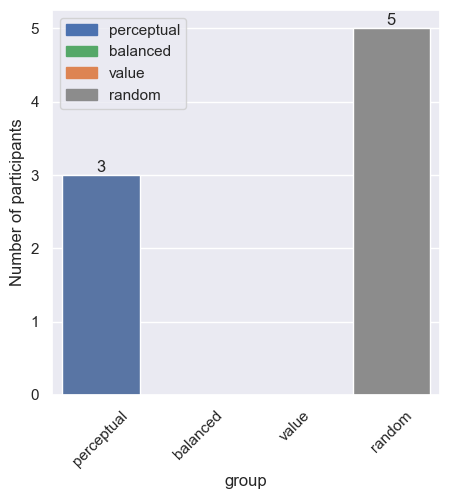

In [41]:
import matplotlib.pyplot as plt
sns.set_context('talk')
# random sho
# plot group distribution
df_ = df[(df.expName.isin(expName))].groupby(['prolificID', 'group'], as_index=False).mean(numeric_only=True)
sns.set(rc={'figure.figsize':(5,5)})
# create new df with count of participants in each group
df_ = df_.groupby(['group']).size().reset_index(name='count')
# sort by count
df_ = df_.sort_values('count', ascending=False)
# now move the random group (df_.group==random) to the en
# d of the dataframe without using append
# first get the index of the random group
# idx = df_[df_.group=='random'].index.values[0]

# df_  = df_[df_.group != 'random']
# then move it tot he end of the dataframe
order = ['perceptual', 'balanced', 'value', 'random']
bar = sns.barplot(data=df_, x='group', y='count', palette=['C0', 'C2', 'C1', 'C7'], order=order)
plt.xticks(rotation=45)
plt.ylabel('Number of participants')
# plt.ylim(0, 15)
# annotate with count of participants
# order is 1=perceptual, 2=balanced, 3=value
for i, row in df_.iterrows():
    order_idx = order.index(row['group'])
    # plt.text(order_idx, row['count'], row['count'], ha='center')
    # annotate with count of participants
    # for each hue, so 6 annotations, 2 for each hue
    plt.text(order_idx, row['count'], row['count'], ha='center', va='bottom')
    # the above is centered, we want to offset to left and right according to hue, so 
    # if i % 2 == 0, then offset to the left, else offset to the right
    # offset = -0.2 if i % 2 == 0 else 0.2
    # plt.text(order_idx + offset, row['count'], row['count'], ha='center', va='bottom')
# get handles from barplot (bars faces)
# get labels from barplot
labels = order
#create handles from color list
handles = [plt.Rectangle((0,0),1,1, color='C0'), plt.Rectangle((0,0),1,1, color='C2'), plt.Rectangle((0,0),1,1, color='C1'), plt.Rectangle((0,0),1,1, color='C7')]
plt.legend(handles, labels, loc='best')

# handles =
plt.title('', fontsize=20)
# plt.legend(loc='upper right', handles=handles, labels=labels)

In [17]:
# plot opti_ss - opti_ff for each group as a ridgeplot
import matplotlib.pyplot as plt
sns.set(rc={'figure.figsize':(8,3.5)})

df_['delta'] = df_.opti_ff - df_.opti_ss

# sns.kdeplot(data=df_, x='delta', hue='group', fill=True, common_norm=False, common_grid=True, palette='colorblind', alpha=.5)
# histogram
sns.histplot(data=df_, x='delta', hue='group', multiple='stack', bins=50, palette=['C0', 'C2', 'C1', 'gray'])
plt.xlabel('p(optimal ff) - p(optimal ss)')
plt.ylabel('Number of participants')




AttributeError: 'DataFrame' object has no attribute 'opti_ff'

In [15]:
df_

,prolificID,group,session,t,pair,choice,outcome1,outcome2,choseLeft,op1IsLeft,...,ev2,p1,p2,m1,m2,destroyed,score,opti_ss,opti_ff,opti_ev


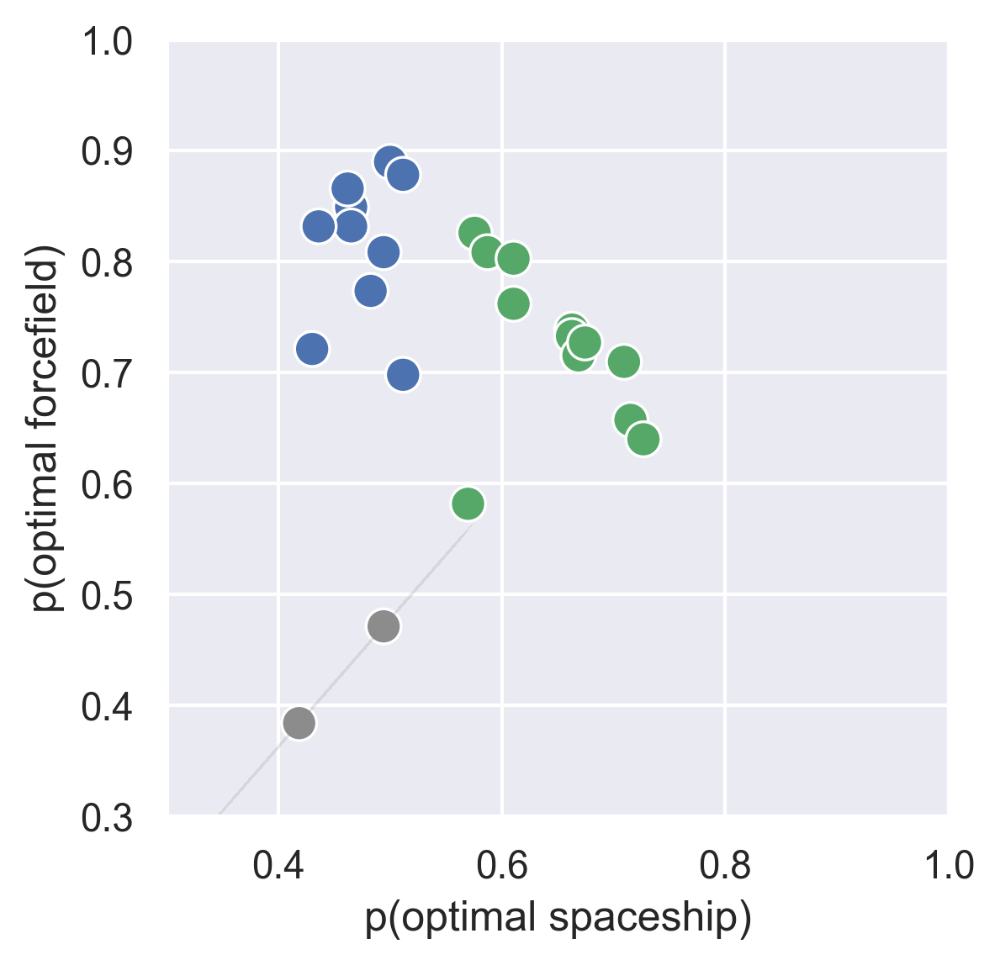

In [17]:
# same but with scatterplot
sns.set(rc={'figure.figsize':(4,4)})
df_ = df[(df.expName.isin(['FullPilot14'])) &  (df.session==3)].groupby(['prolificID', 'group'], as_index=False).mean(numeric_only=True)
# sort by group 
order = ['perceptual', 'combined', 'value', 'random']
df_['group'] = pd.Categorical(df_['group'], categories=order, ordered=True)
# df_ = df_[df_.group != 'random']
sns.scatterplot(data=df_, x='opti_ss', y='opti_ff', hue='group', palette=['C0', 'C2', 'C1', 'C7'], s=100)
sns.kdeplot(data=df_, x='opti_ss', y='opti_ff', alpha=0.2, fill=True, palette=['C0', 'C2', 'C1', 'C7'], hue='group', levels=2, bw_adjust=0.6, thresh=0.001)
# add a third dimension (opti_ev)
plt.ylim(0.3, 1)
plt.xlim(0.3, 1)
plt.xlabel('p(optimal spaceship)')
plt.ylabel('p(optimal forcefield)')
# put legend outside
plt.legend(bbox_to_anchor=(1.05, 1)
           , loc=2, borderaxespad=0.)
#no legend
plt.legend().remove()

C:\Users\garciaba\AppData\Local\Temp\ipykernel_26940\1179764883.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_['expName'] = df.session - 2


([<matplotlib.axis.XTick at 0x2750a88ca90>,
 [Text(0, 0, 'session 1'), Text(1, 0, 'session 2')])

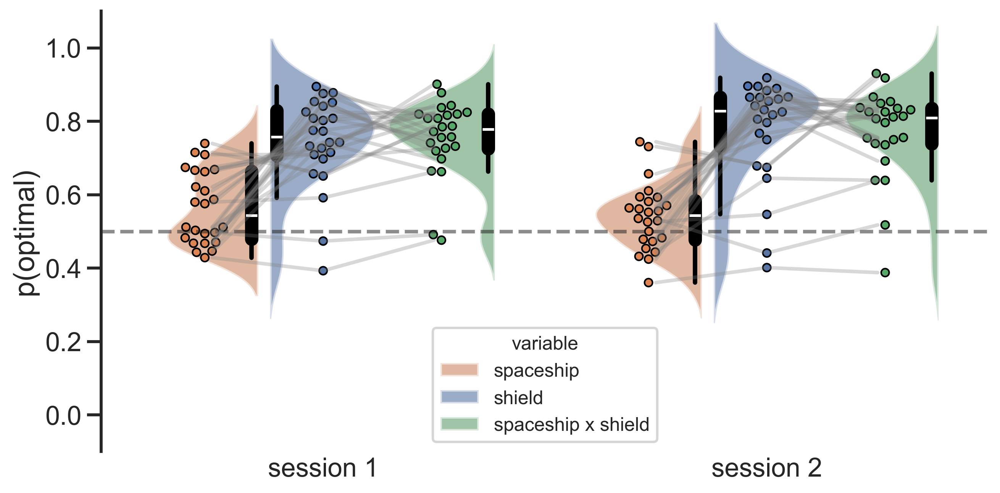

In [20]:
sns.set(rc={'figure.figsize':(10, 5), 'figure.dpi':300})
# set all fonts bigger
sns.set_context('talk')
sns.set_style('ticks')
import matplotlib.pyplot as plt
# sns.set_style('dark')
# plt.style.use('dark_background')
# sns.set_palette('dark')
# sns.set_theme(style='dark')



def plot(y='value', df=None):
    sns.violinplot(y=y, x='expName', hue='y', zorder=0, data=df, alpha=.6, linecolor='w', gap=.1, split=True, 
                     inner_kws={'color': 'black', 'linewidth': 0.5}, palette=['C1', 'C0', 'C2'])
    sns.swarmplot(y=y, x='expName', hue='y', zorder=1,
                    data=df,dodge=True, edgecolor='black', linewidth=1, palette=['C1', 'C0', 'C2'])
    # connect swarm dots with grey lines
    xlim = plt.xlim()
    trace_lines_between_dots(df, y=y)
    # sns.lineplot(y=y, 
                #  x='expName', hue='pair2', zorder=2, style='pair2', 
                #    data=df_, alpha=1, color='grey', units='prolificID', estimator=None, legend=False
                #    )
    plt.xlim(xlim)
    plt.ylim(-.1, 1.1)
    # sns.pointplot(y=y, x='expName', hue='pair2', zorder=2, data=df_, dodge=True, ci=None, estimator=np.mean, markers='o', scale=1.5)
    
    
# trace grey lines between hue categories swarm dots
# to do that we need to get the x position of each prolificID in the swarmplot
# and then draw a line between each pair of dots
def trace_lines_between_dots(df=None, y='opti_ss'):
    for j, expname in enumerate(np.sort(df.expName.unique())):
        for i, name in enumerate(df_[df_.expName==expname].prolificID.unique()):
            d1 = df[(df.prolificID==name) & (df.expName==expname) & (df.y=='opti_ss')]['value']
            assert len(d1) == 1
            d2 = df[(df.prolificID==name) & (df.expName==expname) & (df.y=='opti_ff')]['value']
            assert len(d2) == 1
            d3 = df[(df.prolificID==name) & (df.expName==expname) & (df.y=='opti_ev')]['value']
            y2 = d2.values[0]
            y1 = d1.values[0]
            y3 = d3.values[0]
            plt.plot([j-.25, j, j+.25], [y1, y2, y3], 'grey', alpha=.3)

df_ = df[df.session.isin([3,4])]
# df_ = df_[df_.group!='random']
df_['expName'] = df.session - 2
# df_['expName'] = df_.session.map({3: 'session 3', 4: 'session 4'})
# df_ = df[(df.session.isin([2])) & (df.expName.isin(exp)) & (df.start_with_rl==0)]
df_ = df_[df_.choice != 0]
df_ = df_.groupby(['session', 'prolificID'], as_index=False).mean(numeric_only=True)
# df_ = df_[df_.prolificID!='654cebe5afd0bb3557331628']
# df_ = df_[df_.expName.isin(exp)]
# rename expName to 1, 2, 3
# df_.loc[df_.expName=='FullPilot8', 'expName'] = 1
# df_.loc[df_.expName=='FullPilot9', 'expName'] = 2
# create a new df with col y= opti_ss, opti_ff, opti_ev, expName='FullPilot6.1', 'FullPilot7', value=mean(y)
df_ = pd.melt(df_, id_vars=['expName', 'prolificID'], value_vars=['opti_ss', 'opti_ff', 'opti_ev'], var_name='y', value_name='value')

# plt.subplot(1, 3, 1)

plt.plot([-0.5, len(df.session.unique())+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='value', df=df_)
plt.ylabel('p(optimal)')
sns.despine()
plt.xlabel('')
plt.xticks([])
#45 degree xticks
# plt.xticks(rotation=45)
# plt.legend([],[], frameon=False)
# only keep first two legend handles
handles = plt.gca().get_legend_handles_labels()[0]
plt.legend(handles[0:3], ['spaceship', 'shield', 'spaceship x shield'], title='variable', loc='lower center', fontsize=12, title_fontsize=12)
# handle size

plt.tick_params(axis='x', length=0)
sns.despine(bottom=True)
plt.xticks([0, 1], ['session 1', 'session 2'])

C:\Users\garciaba\AppData\Local\Temp\ipykernel_18548\3489900452.py:14: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  sns.violinplot(y=y, x='session', hue='y', zorder=0, data=df, alpha=.6, linecolor='w', gap=.1, split=True,
C:\Users\garciaba\AppData\Local\Temp\ipykernel_18548\3489900452.py:16: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  sns.swarmplot(y=y, x='session', hue='y', zorder=1,
c:\Users\garciaba\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\seaborn\categorical.py:3399: UserWarning: 6.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


([<matplotlib.axis.XTick at 0x21bcecdd160>,
 [Text(0, 0, 'session 1'), Text(1, 0, 'session 2')])

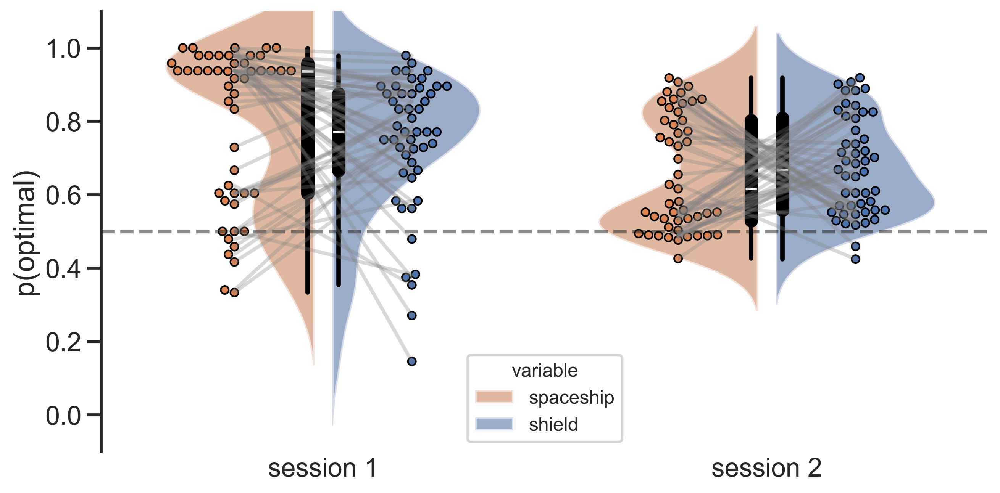

In [488]:
sns.set(rc={'figure.figsize':(10, 5), 'figure.dpi':300})
# set all fonts bigger
sns.set_context('talk')
sns.set_style('ticks')
import matplotlib.pyplot as plt
# sns.set_style('dark')
# plt.style.use('dark_background')
# sns.set_palette('dark')
# sns.set_theme(style='dark')



def plot(y='value', df=None):
    sns.violinplot(y=y, x='session', hue='y', zorder=0, data=df, alpha=.6, linecolor='w', gap=.1, split=True, 
                     inner_kws={'color': 'black', 'linewidth': 0.5}, palette=['C1', 'C0', 'C2'])
    sns.swarmplot(y=y, x='session', hue='y', zorder=1,
                    data=df,dodge=True, edgecolor='black', linewidth=1, palette=['C1', 'C0', 'C2'])
    # connect swarm dots with grey lines
    xlim = plt.xlim()
    trace_lines_between_dots(df, y=y)
    # sns.lineplot(y=y, 
                #  x='expName', hue='pair2', zorder=2, style='pair2', 
                #    data=df_, alpha=1, color='grey', units='prolificID', estimator=None, legend=False
                #    )
    plt.xlim(xlim)
    plt.ylim(-.1, 1.1)
    # sns.pointplot(y=y, x='expName', hue='pair2', zorder=2, data=df_, dodge=True, ci=None, estimator=np.mean, markers='o', scale=1.5)
    
    
# trace grey lines between hue categories swarm dots
# to do that we need to get the x position of each prolificID in the swarmplot
# and then draw a line between each pair of dots
def trace_lines_between_dots(df=None, y='opti_ss'):
    for j, expname in enumerate(np.sort(df.session.unique())):
        for i, name in enumerate(df_[df_.session==expname].prolificID.unique()):
            d1 = df[(df.prolificID==name) & (df.session==expname) & (df.y=='opti_ss')]['value']
            d2 = df[(df.prolificID==name) & (df.session==expname) & (df.y=='opti_ff')]['value']
            y2 = d2.values[0]
            y1 = d1.values[0]
            plt.plot([j-.2, j+.2], [y1, y2], 'grey', alpha=.3)

df_ = df[df.session.isin([1, 2, 3])]

df_ = df_[df_.group!='random']

df_ = df_[df_.choice != 0]
df_ = df_.groupby(['session', 'prolificID'], as_index=False).mean(numeric_only=True)

df_.loc[(df_.session==2), 'opti_ff'] = df_.loc[(df_.session==1)].opti_ff.values
df_ = df_[df_.session!=1]
df_ = pd.melt(df_, id_vars=['session', 'prolificID'], value_vars=['opti_ss', 'opti_ff'], var_name='y', value_name='value')

plt.plot([-0.5, len(df.session.unique())+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='value', df=df_)
plt.ylabel('p(optimal)')
sns.despine()
plt.xlabel('')
plt.xticks([])
#45 degree xticks
# plt.xticks(rotation=45)
# plt.legend([],[], frameon=False)
# only keep first two legend handles
handles = plt.gca().get_legend_handles_labels()[0]
plt.legend(handles[0:3], ['spaceship', 'shield'], title='variable', loc='lower center', fontsize=12, title_fontsize=12)
# handle size

plt.tick_params(axis='x', length=0)
sns.despine(bottom=True)
plt.xticks([0, 1], ['session 1', 'session 2'])

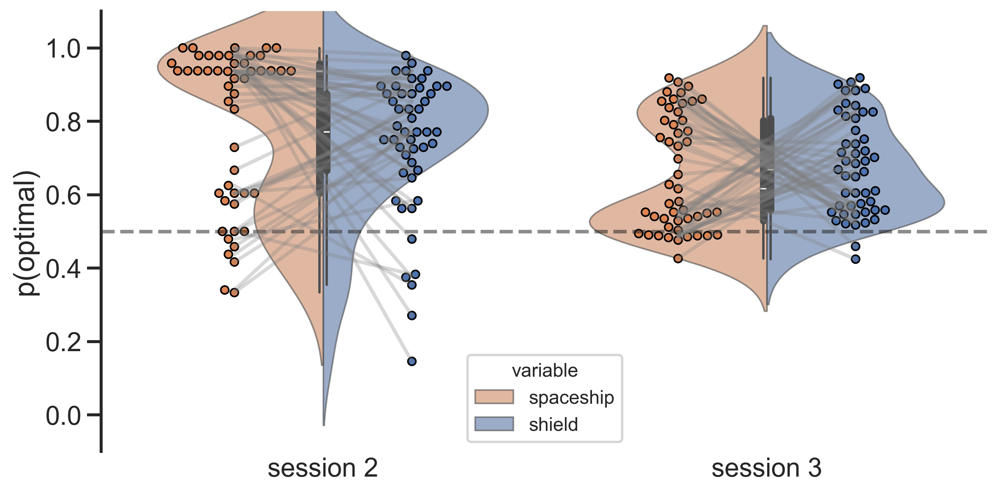

In [495]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Set plot styles
sns.set(rc={'figure.figsize': (10, 5), 'figure.dpi': 300})
sns.set_context('talk')
sns.set_style('ticks')

# Adjusted plot function
def plot(y='value', df=None):
    sns.violinplot(
        y=y, x='session', hue='y', zorder=0, data=df,
        alpha=.6, linewidth=1, split=True, 
         palette=['C1', 'C0']
    )
    sns.swarmplot(
        y=y, x='session', hue='y', zorder=1,
        data=df, dodge=True, edgecolor='black', linewidth=1, palette=['C1', 'C0']
    )
    xlim = plt.xlim()
    trace_lines_between_dots(df, y=y)
    plt.xlim(xlim)
    plt.ylim(-.1, 1.1)

# Function to trace grey lines between swarm dots
def trace_lines_between_dots(df=None, y='value'):
    for j, session in enumerate(np.sort(df.session.unique())):
        for i, pid in enumerate(df[df.session == session].prolificID.unique()):
            d1 = df[(df.prolificID == pid) & (df.session == session) & (df.y == 'opti_ss')]['value']
            d2 = df[(df.prolificID == pid) & (df.session == session) & (df.y == 'opti_ff')]['value']
            if not d1.empty and not d2.empty:
                plt.plot([j - 0.2, j + 0.2], [d1.values[0], d2.values[0]], 'grey', alpha=0.3)

df_ = df[df.session.isin([1, 2, 3])]
df_ = df_[df_.group!='random']
df_ = df_[df_.choice != 0]
df_ = df_.groupby(['session', 'prolificID'], as_index=False).mean(numeric_only=True)
df_.loc[(df_.session==2), 'opti_ff'] = df_.loc[(df_.session==1)].opti_ff.values
df_ = df_[df_.session!=1]

df_ = pd.melt(
    df_, id_vars=['session', 'prolificID'], value_vars=['opti_ss', 'opti_ff'],
    var_name='y', value_name='value'
)

# Plotting
plt.figure()
plt.plot([-0.5, len(df_.session.unique()) + 0.5], [0.5, 0.5], 'k--', alpha=0.5)
plot(y='value', df=df_)
plt.ylabel('p(optimal)')
sns.despine()
plt.xlabel('')
plt.xticks([0, 1], ['session 2', 'session 3'])

# Adjust legend
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles[:2], ['spaceship', 'shield'], title='variable', loc='lower center', fontsize=12, title_fontsize=12)
plt.tick_params(axis='x', length=0)
sns.despine(bottom=True)
plt.show()


# df_ = pd.melt(df_, id_vars=['session', 'prolificID'], value_vars=['opti_ss', 'opti_ff'], var_name='y', value_name='value')


In [ ]:
# import system module
import sys
sys.path.append('../')
import src.visualization.sankey as sankey

# create a sankey diagram


In [475]:
sum(df_.session==1)
len(df_.loc[(df_.session==2), 'opti_ff'])
# len(df_[(df_.session==1)].opti_ff)

49

In [419]:
# compute proportion of choice == 0 in session 4
df_ = df[df.session==4]
sum(df_.choice==0) / len(df_.choice!=None)

0.13081015086770734

In [ ]:
ci

In [46]:
#  number of trials in sessions 4 for each prolificID
df_ = df[df.session.isin([4])]
# df_ = df_[df_.choice == 0]
# df_ = df_.groupby('prolificID').size().reset_index(name='count')
# df_.groupby('count').size()

# compute the number of choice == 0 over total number of trials
df_ = df[df.session.isin([4])]
df_[df_.choice==0].size / df_.size



0.13861166555777335

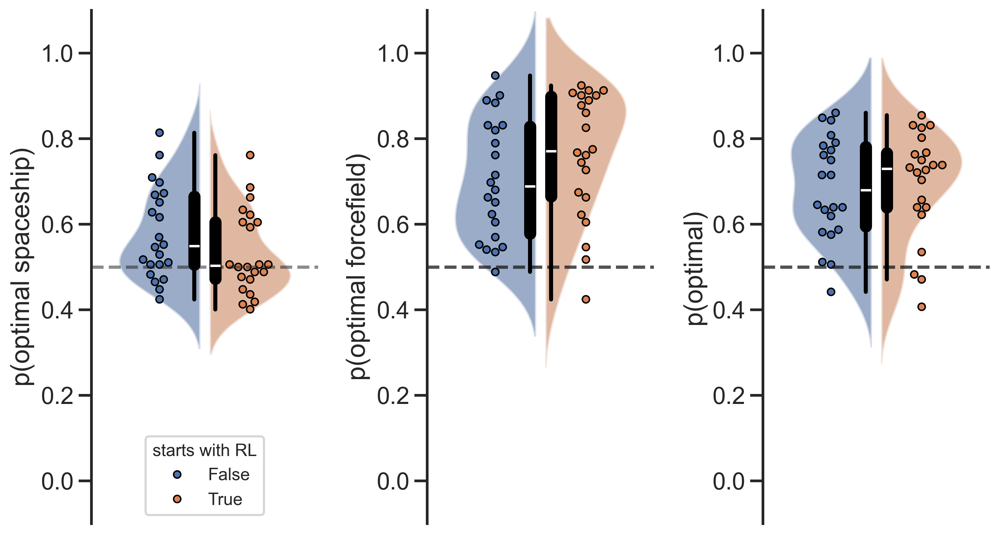

In [ ]:
df['opti_ss'] = ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))
import matplotlib.pyplot as plt

sns.set(rc={'figure.figsize':(10, 5.5), 'figure.dpi':300})
# set all fonts bigger
sns.set_context('talk')
sns.set_style('ticks')
# sns.set_style('dark')
# plt.style.use('dark_background')
# sns.set_palette('dark')
# sns.set_theme(style='dark')

def plot(y='opti_ss', df=None):
    sns.violinplot(y=y, x='expName', hue='start_with_rl', zorder=0, data=df, alpha=.6, linecolor='w', gap=.1, split=True,
                     inner_kws={'color': 'black', 'linewidth': 0.5})
    sns.swarmplot(y=y, x='expName', hue='start_with_rl', zorder=1,
                    data=df,dodge=True, edgecolor='black', linewidth=1)
    # connect swarm dots with grey lines
    xlim = plt.xlim()
    # trace_lines_between_dots(df, y=y)
    # sns.lineplot(y=y, 
                #  x='expName', hue='pair2', zorder=2, style='pair2', 
                #    data=df_, alpha=1, color='grey', units='prolificID', estimator=None, legend=False
                #    )
    plt.xlim(xlim)
    plt.ylim(-.1, 1.1)
    # sns.pointplot(y=y, x='expName', hue='pair2', zorder=2, data=df_, dodge=True, ci=None, estimator=np.mean, markers='o', scale=1.5)
    
    
# trace grey lines between hue categories swarm dots
# to do that we need to get the x position of each prolificID in the swarmplot
# and then draw a line between each pair of dots
# def trace_lines_between_dots(df=None, y='opti_ss'):
    # for j, expname in enumerate(np.sort(df.expName.unique())):
        # for i, name in enumerate(df[df.expName==expname].prolificID.unique()):
            # y2 = df[(df.prolificID==name) & (df.start_with_rl==False) & (df.expName==expname)][y].values[0]
            # y1 = df[(df.prolificID==name) & (df.start_with_rl==True) & (df.expName==expname)][y].values[0]
            # plt.plot([j-.1, j+.1], [y1, y2], 'grey', alpha=.4)


df_ = df[df.session.isin([3])]

exp = ['FullPilot10']

df_ = df_.groupby(['expName', 'prolificID', 'start_with_rl'], as_index=False).mean(numeric_only=True)
# df_ = df_[df_.prolificID!='654cebe5afd0bb3557331628']
df_ = df_[df_.expName.isin(exp)]
plt.subplot(1, 3, 1)

plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='opti_ss', df=df_)
plt.ylabel('p(optimal spaceship)')
sns.despine()
plt.xlabel('exp')
plt.xlabel('')
plt.xticks([])

#45 degree xticks
# plt.xticks(rotation=45)
# plt.legend([],[], frameon=False)
# only keep first two legend handles
handles = plt.gca().get_legend_handles_labels()[0]
labels = plt.gca().get_legend_handles_labels()[1]
plt.legend(handles[2:], labels[2:], title='starts with RL', loc='lower center', fontsize=12, title_fontsize=12)
# handle size

plt.tick_params(axis='x', length=0)


plt.subplot(1, 3, 2)
plt.plot([-0.5, 4.5], [0.5, 0.5], 'k--', alpha=0.5) 
plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='opti_ff', df=df_)

sns.despine()
plt.xlabel('exp')
plt.ylabel('p(optimal forcefield)')
plt.legend([],[], frameon=False)
plt.tight_layout()
plt.xlabel('')
plt.xticks([])

# plt.xticks(rotation=45)
plt.tick_params(axis='x', length=0)



plt.subplot(1, 3, 3)

plt.plot([-0.5, 4.5], [0.5, 0.5], 'k--', alpha=0.5) 
plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='opti_ev', df=df_)
#remove legend
plt.legend([],[], frameon=False)
sns.despine()
plt.xlabel('exp')
plt.ylabel('p(optimal)')
plt.xlabel('')
plt.xticks([])

plt.tight_layout()
# plt.xticks(rotation=45)

sns.despine(bottom=True)
# remove xticks length
plt.tick_params(axis='x', length=0)

# plt.xticks([0, 1, 2], ['no counterfactual', 'counterfactual + 0', 'counterfactual + reward/2'])

# create a legend without color 
# with just this labeling
# legend 1= no counterfactual, 2= counterfactual + 0, 3= counterfactual + reward/2
# 
# plt.annotate('1 = no counterfactual', xy=(0, 0), xytext=(-1.5, -0.2), textcoords='axes fraction', ha='center', va='center')
# plt.annotate('2 = counterfactual + 0', xy=(0, 0), xytext=(-1, -0.2), textcoords='axes fraction', ha='center', va='center')
# plt.annotate('3 = counterfactual + reward/2', xy=(0, 0), xytext=(-.4, -0.2), textcoords='axes fraction', ha='center', va='center')


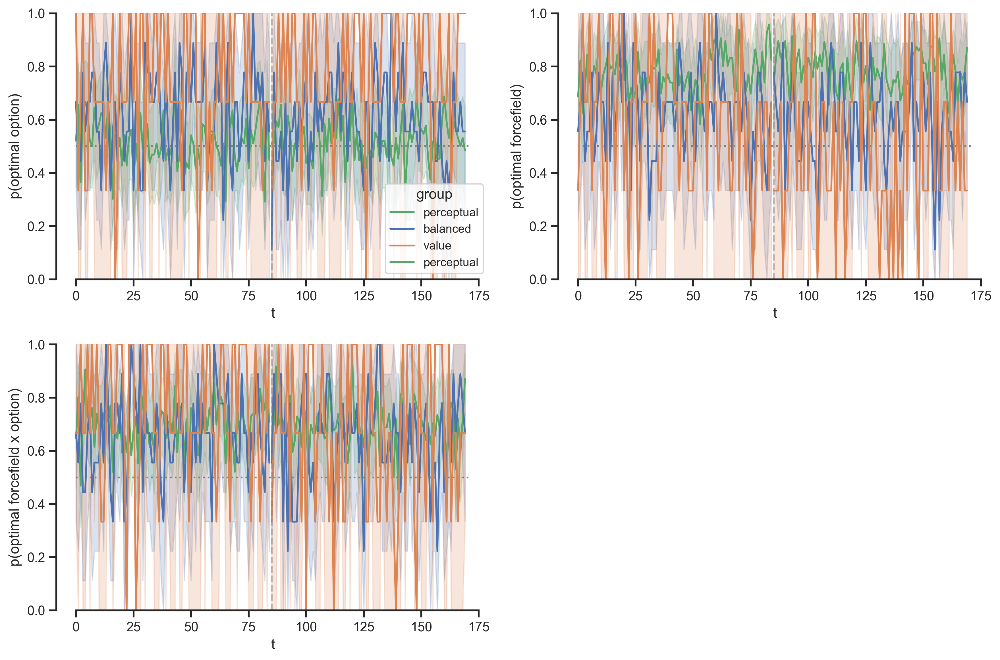

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set({'figure.figsize': (12, 8)})
sns.set_style('ticks')
# set legend fontsize
plt.rcParams['legend.fontsize'] = 10
# dpi 300
plt.rcParams['figure.dpi'] = 300
# increase axes width
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5
# increase font size
plt.rcParams.update({'font.size': 15})


palette = ['C2', 'C0', 'C1', 'grey']
sns.set_palette(palette=palette)
# Plot 1 - p(optimal option)
plt.subplot(2, 2, 1)

ntrial = df.t.max()
ntrial_per_block = ntrial // 2

r1, r2 = df[df.t.isin(range(0, ntrial_per_block))], df[df.t.isin(range(ntrial_per_block, ntrial_per_block*2))]
# plot dotted line at .5
plt.plot([0, ntrial], [.5, .5], color='grey', linestyle=':')
sns.lineplot(x='t', y='opti_ss', data=r1, hue='group')
sns.lineplot(x='t', y='opti_ss', data=r2, hue='group')
plt.ylabel('p(optimal option)')
plt.ylim(0, 1 )
sns.despine(trim=True)

plt.plot([ntrial_per_block, ntrial_per_block], [0, 1], color='grey', linestyle='--', alpha=.5)

h, l = plt.gca().get_legend_handles_labels()
plt.legend(h[:4], l[:4], title='group')

# Plot 2 - p(optimal ff)
plt.subplot(2, 2, 2)
# plot dotted line at .5
plt.plot([0, ntrial], [.5, .5], color='grey', linestyle=':')
sns.lineplot(x='t', y='opti_ff', data=r1, hue='group')
sns.lineplot(x='t', y='opti_ff', data=r2, hue='group')
plt.ylabel('p(optimal forcefield)')
plt.ylim(0, 1 )
sns.despine(trim=True)

plt.plot([ntrial_per_block, ntrial_per_block], [0, 1], color='grey', linestyle='--', alpha=.5)

plt.legend([],[], frameon=False)
# h, l = plt.gca().get_legend_handles_labels()
# plt.legend(h[:4], l[:4], title='model')

# Plot 3 - p(optimal ff x option)
plt.subplot(2, 2, 3)
# plot dotted line at .5
plt.plot([0, ntrial], [.5, .5], color='grey', linestyle=':')
sns.lineplot(x='t', y='opti_ev', data=r1, hue='group')
sns.lineplot(x='t', y='opti_ev', data=r2, hue='group')
plt.ylabel('p(optimal forcefield x option)')
plt.ylim(0, 1 )
sns.despine(trim=True)
# add vertical grey dashed lines at 25
plt.plot([ntrial_per_block, ntrial_per_block], [0, 1], color='grey', linestyle='--', alpha=.5)

# h, l = plt.gca().get_legend_handles_labels()
# plt.legend(h[:4], l[:4], title='model')
plt.legend([],[], frameon=False)

# # Plot 4 - cumulative
# plt.subplot(2, 2, 4)
# df2 = df.sort_values(['model', 'trial'])
# for model in df2.model.unique():
#     if model == 'random':
#         continue
#     df2.loc[df2.model==model, 'cumulative_reward'] -= df2[df2.model=='random'].cumulative_reward.values 

# # drop random model
# df2 = df2[df2.model!='random']

# sns.lineplot(x='trial', y='cumulative_reward', data=df2, hue='model', n_boot=0, errorbar='se')
# sns.despine(trim=True)
# plt.ylabel('cumulative reward - chance')
# # # plt.ylim(0, 1 )

# h, l = plt.gca().get_legend_handles_labels()
# plt.legend(h[:4], l[:4], title='model')

# plt.suptitle(str(blocks))
plt.tight_layout()
# plt.savefig('figs/result1.svg')



In [ ]:
# lm model opti_ss  in function of pair

x1 = df_[df_.pair=='regular']['opti_ev'].values
y1 = df_[df_.pair=='SS control']['opti_ss'].values

x2 = df_[df_.pair=='regular']['opti_ev'].values
y2 = df_[df_.pair=='FF control']['opti_ff'].values

# print(len(x), len(y))
sns.set({'figure.figsize': (5, 5), 'figure.dpi': 100})
sns.set_style('white')
sns.set_context('talk')

# plot R squared and p-value from linear regression
import matplotlib.pyplot as plt
import statsmodels.api as sm

model1 = sm.OLS(y1, sm.add_constant(x1)).fit()
model2 = sm.OLS(y2, sm.add_constant(x2)).fit()

plt.scatter(x1, y1, label='SS', color='C0', edgecolors='black')
plt.scatter(x2, y2, label='FF', color='C1', edgecolors='black')
plt.plot(x1, model1.predict(sm.add_constant(x1)), color='C0')
plt.plot(x2, model2.predict(sm.add_constant(x2)), color='C1')
plt.xlabel('full trials p(optimal)')
plt.ylabel('control trials p(optimal)')
plt.legend()

# plot R squared and p-value from linear regression
plt.text(0.1, 0.2, f'R2={model1.rsquared:.2f}, p={model1.f_pvalue:.2f}', transform=plt.gca().transAxes, color='C0')
plt.text(0.1, 0.1, f'R2={model2.rsquared:.2f}, p={model2.f_pvalue:.2f}', transform=plt.gca().transAxes, color='C1')

sns.despine()
plt.show()




TypeError: numpy boolean subtract, the `-` operator, is not supported, use the bitwise_xor, the `^` operator, or the logical_xor function instead.

In [ ]:
# count number of trials per session in FullPilot6
df[df.expName == 'FullPilot6'].groupby('session').t.nunique()
# in session 1 identify pairs (name 1, name 2) and compute average outcome (outcome 1, outcome 2)
df[(df.expName == 'FullPilot6') & (df.session == 1)].groupby(['name1']).outcome1.mean()

name1
FFEnemyShipNocolors1    62.708333
FFEnemyShipNocolors3    70.638889
Name: outcome1, dtype: float64

In [ ]:
df.loc[(df.expName == 'FullPilot6.1') & (df.session == 1) & (df.name2=='FFEnemyShipNoColors12'), 'pair'] = 0
df.loc[(df.expName == 'FullPilot6.1') & (df.session == 1) & (df.name2!='FFEnemyShipNoColors12'), 'pair'] = 1

df.loc[(df.expName == 'FullPilot6.1') & (df.session == 1) & (df.pair==0), 'm1'] = 62
df.loc[(df.expName == 'FullPilot6.1') & (df.session == 1) & (df.pair==0), 'm2'] = 38
df.loc[(df.expName == 'FullPilot6.1') & (df.session == 1) & (df.pair==1), 'm1'] = 72
df.loc[(df.expName == 'FullPilot6.1') & (df.session == 1) & (df.pair==1), 'm2'] = 28

# now recompute ev1 and ev2 by multiplying m1 and m2 by p1 and p2
df['ev1'] = df.m1 * df.p1
df['ev2'] = df.m2 * df.p2

# Check overall stats

In [ ]:
print('number of trials=', df.shape[0])
print('overall outcome mean=', pd.concat((df.outcome1, df.outcome2)).mean())
print('overall theoretical mean=', pd.concat((df.m1, df.m2)).mean())
print('overall p mean=', pd.concat((df.p1, df.p2)).mean())
print('outcome1 mean=', df.outcome1.mean())
print('outcome2 mean=', df.outcome2.mean())
print('p1 mean=', df.p1.mean())
print('p2 mean=', df.p2.mean())
print('p1 std=', df.p1.std())
print('p2 std=', df.p2.std())

# compute observed mean for each spaceship
names = pd.concat([df.name1, df.name2]).unique()
names

number of trials= 1728
overall outcome mean= 50.30555555555556
overall theoretical mean= 50.0
overall p mean= 0.5833333333333334
outcome1 mean= 62.536458333333336
outcome2 mean= 38.07465277777778
p1 mean= 0.5833333333333334
p2 mean= 0.5833333333333334
p1 std= 0.30486501137263305
p2 std= 0.30486501137263305


array(['FFEnemyNeutral', 'FFEnemyShipNocolors5', 'FFEnemyShipNocolors8',
       'FFEnemyShipNocolors3', 'FFEnemyShipNoColors11',
       'FFEnemyShipNoColors9', 'FFEnemyShipNocolors2',
       'FFEnemyShipNoColors12', 'FFEnemyShipNocolors6',
       'FFEnemyShipNocolors7', 'FFEnemyShipNocolors1'], dtype=object)

In [ ]:
# compute STD rewards for each expName
for exp in df.expName.unique():
    print(exp, df[(df.expName==exp) & (df.session.isin([1]))].outcome2.std())

FullPilot 18.603439051822996
FullPilot2 18.78485790646308
FullPilot3 10.517116715109028
FullPilot4 5.126841986386545
FullPilot5 10.717873399201743


# Check Means

In [ ]:
# compute observed mean for each spaceship
names = pd.concat([df.name1, df.name2]).unique()

for name in names:
    print(name)
    observed_mean1 = np.round(df[(df.name1==name) & (df.destroyed==1)].outcome1.mean(), 2)
    observed_mean2 = np.round(df[(df.name2==name) & (df.destroyed==1)].outcome2.mean(), 2)
    if not np.isnan(observed_mean1):
        print('observed mean 1=', observed_mean1, 'true mean=', df[df.name1==name].m1.mean())
    if not np.isnan(observed_mean2):
        print('observed mean 2=', observed_mean2, 'true mean=', df[df.name2==name].m2.mean())

FFEnemyNeutral
observed mean 1= 50.0 true mean= 50.0
observed mean 2= 50.0 true mean= 50.0
FFEnemyShipNocolors5
observed mean 1= 66.07 true mean= 67.0
observed mean 2= 35.03 true mean= 33.0
FFEnemyShipNocolors8
observed mean 1= 69.62 true mean= 72.0
observed mean 2= 30.34 true mean= 28.0
FFEnemyShipNocolors3
observed mean 1= 62.03 true mean= 62.0
FFEnemyShipNoColors11
observed mean 1= 63.24 true mean= 62.0
observed mean 2= 36.05 true mean= 38.0
FFEnemyShipNoColors9
observed mean 1= 66.92 true mean= 72.0
observed mean 2= 34.61 true mean= 28.0
FFEnemyShipNocolors2
observed mean 1= 63.52 true mean= 67.0
observed mean 2= 36.51 true mean= 33.0
FFEnemyShipNoColors12
observed mean 1= 66.98 true mean= 72.0
observed mean 2= 29.83 true mean= 28.0
FFEnemyShipNocolors6
observed mean 1= 62.36 true mean= 62.0
observed mean 2= 38.03 true mean= 38.0
FFEnemyShipNocolors7
observed mean 1= 68.75 true mean= 72.0
observed mean 2= 31.57 true mean= 28.0
FFEnemyShipNocolors1
observed mean 2= 42.31 true mean= 

([<matplotlib.axis.YTick at 0x1b1d436e580>,
 [Text(0, 0.0, '0.0'),
  Text(0, 0.1, '0.1'),
  Text(0, 0.2, '0.2'),
  Text(0, 0.30000000000000004, '0.3'),
  Text(0, 0.4, '0.4'),
  Text(0, 0.5, '0.5'),
  Text(0, 0.6000000000000001, '0.6'),
  Text(0, 0.7000000000000001, '0.7'),
  Text(0, 0.8, '0.8'),
  Text(0, 0.9, '0.9'),
  Text(0, 1.0, '1.0')])

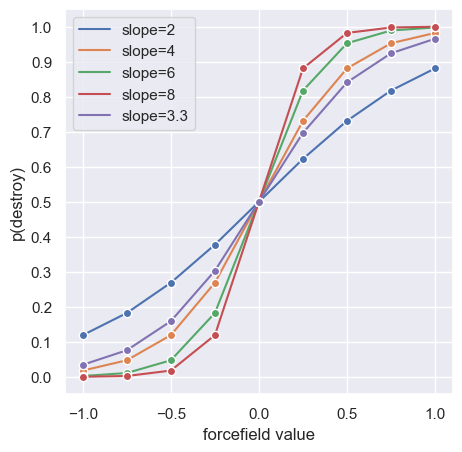

In [ ]:
x1 = np.linspace(-1, 1, 9)
slope1 = -2
x2= np.linspace(-1, 1, 9)
slope2 = -4
x3 = np.linspace(-1, 1, 9)
slope3 = -6
x4 = np.linspace(-1, 1, 9)
slope4 = -8
x5 = np.linspace(-1, 1, 9)
slope5 = -3.33

logistic = lambda x, slope: 1 / (1 + np.exp(slope*x))

sns.set({'figure.figsize': (5, 5), 'figure.dpi': 100})
sns.scatterplot(x=x1, y=logistic(x1, slope1), color='C0', edgecolor='white', lw=1, zorder=10)
sns.scatterplot(x=x2, y=logistic(x2, slope2), color='C1', edgecolor='white', lw=1, zorder=10)
sns.scatterplot(x=x3, y=logistic(x3, slope3), color='C2', edgecolor='white', lw=1, zorder=10)
sns.scatterplot(x=x4, y=logistic(x4, slope4), color='C3', edgecolor='white', lw=1, zorder=10)
sns.scatterplot(x=x5, y=logistic(x5, slope5), color='C4', edgecolor='white', lw=1, zorder=10)

sns.lineplot(x=x1, y=logistic(x1, slope1), color='C0', markers=True, dashes=False, label='slope=2')
sns.lineplot(x=x2, y=logistic(x2, slope2), color='C1', markers=True, dashes=False, label='slope=4')
sns.lineplot(x=x3, y=logistic(x3, slope3), color='C2', markers=True, dashes=False, label='slope=6')
sns.lineplot(x=x4, y=logistic(x4, slope4), color='C3', markers=True, dashes=False, label='slope=8')
sns.lineplot(x=x5, y=logistic(x5, slope5), color='C4', markers=True, dashes=False, label='slope=3.3')
plt.xlim(-1.1, 1.1)
plt.xlabel('forcefield value')
plt.ylabel('p(destroy)')

# yticks should be .1, .2, .3, .4, .5, .6, .7, .8, .9
plt.yticks(np.arange(0, 1.1, .1))

In [ ]:
exp = 'FullPilot5'
session = 2

df_ = df[(df.expName == exp) & (df.session == session)]

for p1 in df_.p1.unique():
    print(p1, df_[(df_.p1 == p1) & (df_.choice == 1)].destroyed.mean())

0.27 0.44
0.38 0.5
0.73 0.8157894736842105
0.5 0.45714285714285713
0.12 0.047619047619047616
0.18 0.21739130434782608
0.88 0.84375
0.62 0.5862068965517241
0.82 0.8780487804878049


In [ ]:
df.datetime

20191    2024-04-29 16:15:53
20192    2024-04-29 16:15:57
20193    2024-04-29 16:16:01
20194    2024-04-29 16:16:04
20195    2024-04-29 16:16:07
                ...         
57852    2024-06-05 15:51:06
57853    2024-06-05 15:51:11
57854    2024-06-05 15:51:15
57855    2024-06-05 15:51:19
57856    2024-06-05 15:51:24
Name: datetime, Length: 34597, dtype: object

In [ ]:
#sum outcomes

for pid in df.prolificID[df.datetime.str.contains('2024-05-30')].unique():
    obtained = df[(df.prolificID==pid) & (df.destroyed==1) & (df.choice==1)].outcome1.sum() + df[(df.prolificID==pid) &(df.destroyed==1) & (df.choice==2)].outcome2.sum()
    obtained = np.round(obtained* 0.00028, 2)
    print(f'{pid},{obtained}')


576ad50bc8a90000010d99c8,3.63
5c95493ddd325800166f838a,4.61
655f95ffd90905e27c938a49,3.9
6630f8c1f995b01de9767c7d,4.42
61230b14a3bcb65c585dfdaa,4.71
655f98627ee2491a2184c294,4.31
65dcca0d187f1e33aa00fca1,4.36
6574a4e29c6576b736f0388b,4.38
6117be8d81c34e0b13821371,4.88
62ceba5fdab49dfc90278cbb,4.0


In [ ]:
df[df.session.isin([2])].m1.unique()

array([72, 62], dtype=int64)

In [ ]:
# for each p compute the probability of destroying the spaceship
pp = pd.concat([df.p1, df.p2]).unique()
for p in sorted(pp):
    print(p)
    # print('p1=', p, 'p2=', 1-p)
    # get all instances of p1 and p2 = p
    all = df[((df.p1==p) & (df.choice==1)) | ((df.p2==p) & (df.choice==2))]
    print('observed mean=', all.destroyed.mean())
    # compute the probability of destroying the spaceship


0.12
observed mean= 0.12737127371273713
0.18
observed mean= 0.1655011655011655
0.27
observed mean= 0.2616033755274262
0.38
observed mean= 0.355877616747182
0.5
observed mean= 0.4993646759847522
0.62
observed mean= 0.624332977588047
0.73
observed mean= 0.7373646209386282
0.82
observed mean= 0.8207792207792208
0.88
observed mean= 0.8802122820318423
1.0
observed mean= 1.0


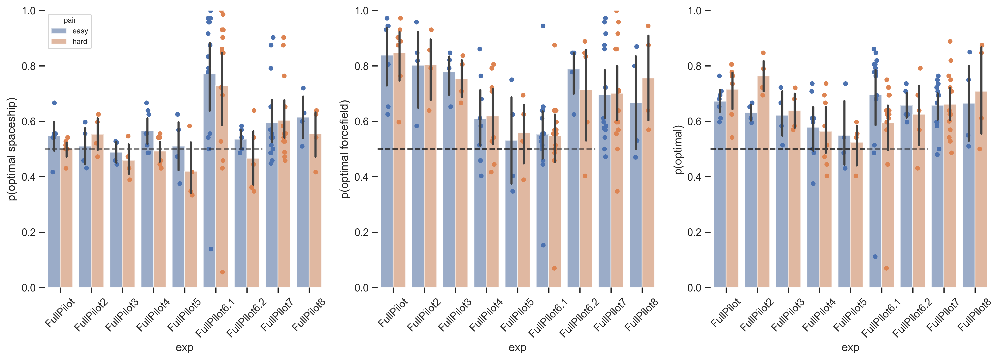

In [ ]:
df['opti_ss'] = df.choice==1 # ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))
import matplotlib.pyplot as plt
df['pair2'] = df.pair.apply(lambda x: 'hard'  if x == 0 else 'easy')

sns.set(rc={'figure.figsize':(15, 5.5), 'figure.dpi':300})
sns.set_style('ticks')
# sns.set_style('dark')
# plt.style.use('dark_background')
# sns.set_palette('dark')
# sns.set_theme(style='dark')



df_ = df[df.session.isin([2])]

exp = ['FullPilot1', 'FullPilot2', 'FullPilot3', 'FullPilot4', 'FullPilot5', 'FullPilot6']

df_ = df_.groupby(['expName', 'prolificID', 'pair2'], as_index=False).mean(numeric_only=True)
df_ = df_[df_.prolificID!='654cebe5afd0bb3557331628']

plt.subplot(1, 3, 1)

plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
sns.barplot(y='opti_ss', x='expName', hue='pair2', alpha=0.6, zorder=0,
            data=df_)
sns.stripplot(y='opti_ss', x='expName', hue='pair2', zorder=1,
              data=df_,dodge=True)
plt.ylim(0, 1)
plt.ylabel('p(optimal spaceship)')
sns.despine()
plt.xlabel('exp')
#45 degree xticks
plt.xticks(rotation=45)
# plt.legend([],[], frameon=False)
# only keep first two legend handles
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles[0:2], labels[0:2], title='pair', loc='upper left', fontsize=8, title_fontsize=8
           )

plt.subplot(1, 3, 2)

plt.plot([-0.5, 4.5], [0.5, 0.5], 'k--', alpha=0.5) 
plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
sns.barplot(y='opti_ff', x='expName', hue='pair2', alpha=0.6, zorder=0,
            data=df_)
sns.stripplot(y='opti_ff', x='expName', hue='pair2', zorder=1,
                data=df_, dodge=True)

sns.despine()
plt.xlabel('exp')
plt.ylabel('p(optimal forcefield)')
plt.ylim(0, 1)
plt.legend([],[], frameon=False)
plt.tight_layout()

plt.xticks(rotation=45)
plt.subplot(1, 3, 3)

plt.plot([-0.5, 4.5], [0.5, 0.5], 'k--', alpha=0.5) 
plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
sns.barplot(y='opti_ev', x='expName', hue='pair2', alpha=0.6, zorder=0,
            data=df_)
sns.stripplot(y='opti_ev', x='expName', hue='pair2', zorder=1,
                data=df_, dodge=True)
#remove legend
plt.legend([],[], frameon=False)
sns.despine()
plt.xlabel('exp')
plt.ylabel('p(optimal)')
plt.ylim(0, 1)
plt.tight_layout()
plt.xticks(rotation=45)

sns.despine(bottom=True, left=True)


Text(-0.4, -0.2, '3 = counterfactual + reward/2')

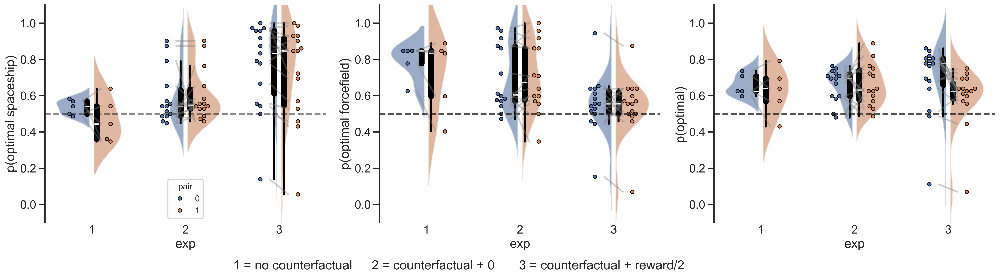

In [ ]:
df['opti_ss'] = ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))
df.loc[df.datetime.str.contains('2024-05-22') & (df.expName=='FullPilot6'), 'expName'] = 'FullPilot6.1'
df.loc[df.expName=='FullPilot6', 'expName'] = 'FullPilot6.2'
import matplotlib.pyplot as plt
df['pair2'] = df.pair.apply(lambda x: 'hard'  if x == 0 else 'easy')

sns.set(rc={'figure.figsize':(20, 5.5), 'figure.dpi':300})
# set all fonts bigger
sns.set_context('talk')
sns.set_style('ticks')
# sns.set_style('dark')
# plt.style.use('dark_background')
# sns.set_palette('dark')
# sns.set_theme(style='dark')

def plot(y='opti_ss', df=None):
    sns.violinplot(y=y, x='expName', hue='pair2', zorder=0, data=df, alpha=.6, linecolor='w', gap=.1, split=True,
                     inner_kws={'color': 'black', 'linewidth': 0.5})
    sns.swarmplot(y=y, x='expName', hue='pair2', zorder=1,
                    data=df,dodge=True, edgecolor='black', linewidth=1)
    # connect swarm dots with grey lines
    xlim = plt.xlim()
    trace_lines_between_dots(df, y=y)
    # sns.lineplot(y=y, 
                #  x='expName', hue='pair2', zorder=2, style='pair2', 
                #    data=df_, alpha=1, color='grey', units='prolificID', estimator=None, legend=False
                #    )
    plt.xlim(xlim)
    plt.ylim(-.1, 1.1)
    # sns.pointplot(y=y, x='expName', hue='pair2', zorder=2, data=df_, dodge=True, ci=None, estimator=np.mean, markers='o', scale=1.5)
    
    
# trace grey lines between hue categories swarm dots
# to do that we need to get the x position of each prolificID in the swarmplot
# and then draw a line between each pair of dots
def trace_lines_between_dots(df=None, y='opti_ss'):
    for j, expname in enumerate(np.sort(df.expName.unique())):
        for i, name in enumerate(df[df.expName==expname].prolificID.unique()):
            y2 = df[(df.prolificID==name) & (df.pair2=='hard') & (df.expName==expname)][y].values[0]
            y1 = df[(df.prolificID==name) & (df.pair2=='easy') & (df.expName==expname)][y].values[0]
            plt.plot([j-.1, j+.1], [y1, y2], 'grey', alpha=.4)


df_ = df[df.session.isin([2])]

exp = ['FullPilot6.2', 'FullPilot6.1', 'FullPilot7']

df_ = df_.groupby(['expName', 'prolificID', 'pair2'], as_index=False).mean(numeric_only=True)
# df_ = df_[df_.prolificID!='654cebe5afd0bb3557331628']
df_ = df_[df_.expName.isin(exp)]
df_.loc[df_.expName=='FullPilot6.2', 'expName'] = 1
df_.loc[df_.expName=='FullPilot6.1', 'expName'] = 3
df_.loc[df_.expName=='FullPilot7', 'expName'] = 2
plt.subplot(1, 3, 1)

plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='opti_ss', df=df_)
plt.ylabel('p(optimal spaceship)')
sns.despine()
plt.xlabel('exp')
#45 degree xticks
# plt.xticks(rotation=45)
# plt.legend([],[], frameon=False)
# only keep first two legend handles
handles = plt.gca().get_legend_handles_labels()[0]
plt.legend(handles[2:], labels[2:], title='pair', loc='lower center', fontsize=12, title_fontsize=12)
# handle size

plt.tick_params(axis='x', length=0)


plt.subplot(1, 3, 2)
plt.plot([-0.5, 4.5], [0.5, 0.5], 'k--', alpha=0.5) 
plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='opti_ff', df=df_)

sns.despine()
plt.xlabel('exp')
plt.ylabel('p(optimal forcefield)')
plt.legend([],[], frameon=False)
plt.tight_layout()

# plt.xticks(rotation=45)
plt.tick_params(axis='x', length=0)



plt.subplot(1, 3, 3)

plt.plot([-0.5, 4.5], [0.5, 0.5], 'k--', alpha=0.5) 
plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='opti_ev', df=df_)
#remove legend
plt.legend([],[], frameon=False)
sns.despine()
plt.xlabel('exp')
plt.ylabel('p(optimal)')
plt.tight_layout()
# plt.xticks(rotation=45)

sns.despine(bottom=True)
# remove xticks length
plt.tick_params(axis='x', length=0)

# plt.xticks([0, 1, 2], ['no counterfactual', 'counterfactual + 0', 'counterfactual + reward/2'])

# create a legend without color 
# with just this labeling
# legend 1= no counterfactual, 2= counterfactual + 0, 3= counterfactual + reward/2

plt.annotate('1 = no counterfactual', xy=(0, 0), xytext=(-1.5, -0.2), textcoords='axes fraction', ha='center', va='center')
plt.annotate('2 = counterfactual + 0', xy=(0, 0), xytext=(-1, -0.2), textcoords='axes fraction', ha='center', va='center')
plt.annotate('3 = counterfactual + reward/2', xy=(0, 0), xytext=(-.4, -0.2), textcoords='axes fraction', ha='center', va='center')


([<matplotlib.axis.XTick at 0x1d33670e580>,
 [Text(0, 0, 'no counterfactual'),
  Text(1, 0, 'counterfactual + 0'),
  Text(2, 0, 'counterfactual + reward/2'),
  Text(3, 0, 'controls')])

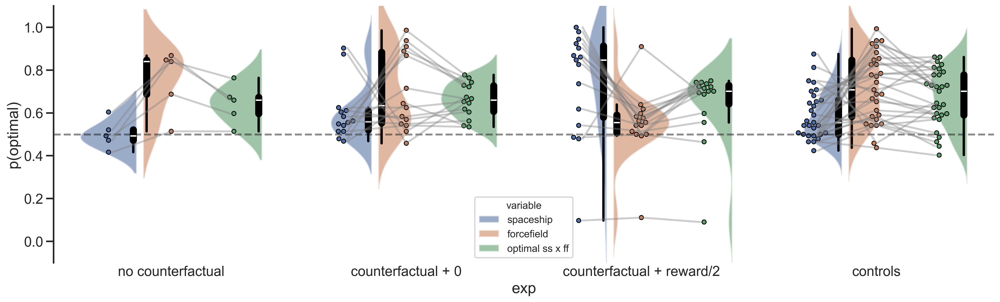

In [ ]:
df = pd.read_csv('../data/raw/controls_start_with_rl_7.csv')
df = df[df.expName.isin(['FullPilot', 'FullPilot2', 'FullPilot3', 'FullPilot4', 'FullPilot5', 'FullPilot6', 'FullPilot6.1', 'FullPilot7', 'FullPilot8'])]

df.loc[df.datetime.str.contains('2024-05-22') & (df.expName=='FullPilot6'), 'expName'] = 'FullPilot6.1'
df.loc[df.expName=='FullPilot6', 'expName'] = 'FullPilot6.2'
# exclude prolificID with less than 432 trials
# df = df.groupby('prolificID').filter(lambda x: len(x) >= 300)
df = df.groupby('prolificID').filter(lambda x: len(x) >= 432)

# keep  prolificIDs that are more than 10 characters
df = df[df.prolificID.str.len() > 10]

df['opti_ss'] = ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))
import matplotlib.pyplot as plt


# ignore if pair < 0
df = df[df.pair >= 0]
df['pair2'] = df.pair.apply(lambda x: 'hard'  if x == 0 else 'easy')

sns.set(rc={'figure.figsize':(20, 5.5), 'figure.dpi':300})
# set all fonts bigger
sns.set_context('talk')
sns.set_style('ticks')
# sns.set_style('dark')
# plt.style.use('dark_background')
# sns.set_palette('dark')
# sns.set_theme(style='dark')



def plot(y='value', df=None):
    sns.violinplot(y=y, x='expName', hue='y', zorder=0, data=df, alpha=.6, linecolor='w', gap=.1, split=True, 
                     inner_kws={'color': 'black', 'linewidth': 0.5})
    sns.swarmplot(y=y, x='expName', hue='y', zorder=1,
                    data=df,dodge=True, edgecolor='black', linewidth=1)
    # connect swarm dots with grey lines
    xlim = plt.xlim()
    trace_lines_between_dots(df, y=y)
    # sns.lineplot(y=y, 
                #  x='expName', hue='pair2', zorder=2, style='pair2', 
                #    data=df_, alpha=1, color='grey', units='prolificID', estimator=None, legend=False
                #    )
    plt.xlim(xlim)
    plt.ylim(-.1, 1.1)
    # sns.pointplot(y=y, x='expName', hue='pair2', zorder=2, data=df_, dodge=True, ci=None, estimator=np.mean, markers='o', scale=1.5)
    
    
# trace grey lines between hue categories swarm dots
# to do that we need to get the x position of each prolificID in the swarmplot
# and then draw a line between each pair of dots
def trace_lines_between_dots(df=None, y='opti_ss'):
    for j, expname in enumerate(np.sort(df.expName.unique())):
        for i, name in enumerate(df_[df_.expName==expname].prolificID.unique()):
            d1 = df[(df.prolificID==name) & (df.expName==expname) & (df.y=='opti_ss')]['value']
            assert len(d1) == 1
            d2 = df[(df.prolificID==name) & (df.expName==expname) & (df.y=='opti_ff')]['value']
            assert len(d2) == 1
            d3 = df[(df.prolificID==name) & (df.expName==expname) & (df.y=='opti_ev')]['value']
            y2 = d2.values[0]
            y1 = d1.values[0]
            y3 = d3.values[0]
            plt.plot([j-.25, j, j+.25], [y1, y2, y3], 'grey', alpha=.4)


df_ = df[df.session.isin([2])]

exp = ['FullPilot6.2', 'FullPilot6.1', 'FullPilot7', 'FullPilot8']

df_ = df_.groupby(['expName', 'prolificID'], as_index=False).mean(numeric_only=True)
# df_ = df_[df_.prolificID!='654cebe5afd0bb3557331628']
df_ = df_[df_.expName.isin(exp)]
# rename expName to 1, 2, 3
df_.loc[df_.expName=='FullPilot6.2', 'expName'] = 1
df_.loc[df_.expName=='FullPilot6.1', 'expName'] = 3
df_.loc[df_.expName=='FullPilot7', 'expName'] = 2
df_.loc[df_.expName=='FullPilot8', 'expName'] = 4
# create a new df with col y= opti_ss, opti_ff, opti_ev, expName='FullPilot6.1', 'FullPilot7', value=mean(y)
df_ = pd.melt(df_, id_vars=['expName', 'prolificID'], value_vars=['opti_ss', 'opti_ff', 'opti_ev'], var_name='y', value_name='value')

# plt.subplot(1, 3, 1)

plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='value', df=df_)
plt.ylabel('p(optimal)')
sns.despine()
plt.xlabel('exp')
#45 degree xticks
# plt.xticks(rotation=45)
# plt.legend([],[], frameon=False)
# only keep first two legend handles
handles = plt.gca().get_legend_handles_labels()[0]
plt.legend(handles[0:3], ['spaceship', 'forcefield', 'optimal ss x ff'], title='variable', loc='lower center', fontsize=12, title_fontsize=12)
# handle size

plt.tick_params(axis='x', length=0)
sns.despine(bottom=True)
plt.xticks([0, 1, 2, 3], ['no counterfactual', 'counterfactual + 0', 'counterfactual + reward/2', 'controls'])

C:\Users\basil\AppData\Local\Temp\ipykernel_18704\2733277918.py:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='m', y='choice_freq_m', data=m_freq, showfliers=False, boxprops=dict(alpha=0.5), zorder=-1, palette='viridis', linewidth=3)
C:\Users\basil\AppData\Local\Temp\ipykernel_18704\2733277918.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='m', y='choice_freq_m',data=m_freq, alpha=0.9, size=6, zorder=1, edgecolor='black', linewidth=0.5, palette='viridis')


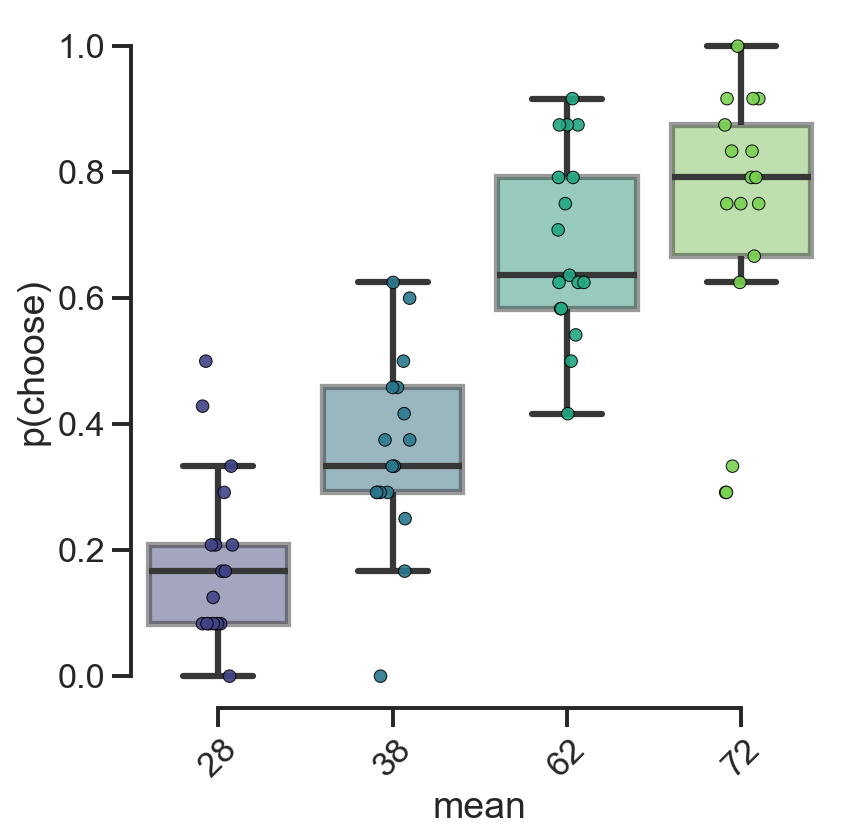

In [ ]:
df = pd.read_csv('../data/raw/control_40.csv')
df = df[df.expName=='FullPilot8']


df = df[df.session.isin([1])]
# ddf = df.copy()
# set id to prolificID
df['id'] = df.prolificID
# plot y as choice frequency for each p
# plot x as p
# plot size as N (number of trials with p)
# pp = np.unique(np.array([df.p1.unique(), df.p2.unique()]).flatten())
mm = np.unique(np.array([df.m1.unique(), df.m2.unique()]).flatten())
# print(pp)
# logit = lambda x: 1/(1+np.exp(-2*x))
# print(logit(np.linspace(-1, 1, 9)).round(2).tolist())
# assert sorted(pp) == logit(np.linspace(-1, 1, 9)).round(2).tolist()
p_freq = []
m_freq = []
for pid in df.id.unique():
    ddf = df[(df.id == pid)]
    # for p1 in pp:
    #     n_p1 = ((ddf.p1 == p1) | (ddf.p2 == p1)).sum()
    #     p_freq.append(
    #         {
    #          'id': pid,
    #          'p': p1,
    #          'choice_freq_p': ((ddf.p1 == p1) & (ddf.choice == 1) | (ddf.p2 == p1) & (ddf.choice == 2)).sum() / n_p1,
    #          'N_p': n_p1,
    #          'correct_p': ((ddf.p1 == p1) & (ddf.choice == 1)  & (ddf.p1 > ddf.p2) | (ddf.p2 == p1) & (ddf.choice == 2) & (ddf.p2 > ddf.p1)).sum() / n_p1,
    #         }
    #     )
    
    for m in mm:
        n_m = ((ddf.m1 == m) | (ddf.m2 == m)).sum()
        m_freq.append(
            {
              'id': pid,
             'm': m,
             'choice_freq_m': ((ddf.m1 == m) & (ddf.choice == 1) | (ddf.m2 == m) & (ddf.choice == 2)).sum() / n_m,
             'N_m': n_m,
             'correct_m': ((ddf.m1 == m) & (ddf.choice == 1)  & (ddf.m1 > ddf.m2) | (ddf.m2 == m) & (ddf.choice == 2) & (ddf.m2 > ddf.m1)).sum() / n_m,
            }
        ) 

p_freq = pd.DataFrame(p_freq)
m_freq = pd.DataFrame(m_freq)

# plt.figure(figsize=(5, 4), dpi=150)
sns.set(rc={'figure.figsize':(6, 6), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
sns.boxplot(x='m', y='choice_freq_m', data=m_freq, showfliers=False, boxprops=dict(alpha=0.5), zorder=-1, palette='viridis', linewidth=3)   

sns.stripplot(x='m', y='choice_freq_m',data=m_freq, alpha=0.9, size=6, zorder=1, edgecolor='black', linewidth=0.5, palette='viridis')

# plot identity line
# plt.plot([0, len(pp)], [0, 1], color='black', linestyle='--', zorder=-10, alpha=0.8)
sns.despine(trim=True)
plt.ylabel('p(choose)')
plt.xlabel('mean')
plt.tick_params(axis='x', rotation=45)
# slides.add('bw.pptx')
# plot text for N on top of bars
# for i in range(d_freq.N
    # plt.text(i, d_freq.choice_freq[i], d_freq.N[i], ha='center', va='bottom')
# pairs = set(map(tuple, (np.array([df.p1, df.p2]).T)))
# pairs = sorted(pairs, key=lambda x: abs(x[0] - x[1]))

# count = 0
# for p in pp:
#     # (a) plot text for N p appears in a pair
#     # (b) plot N for N p appears in a pair and is best response
#     # must be a/b
#     a = sum([p in pair for pair in pairs])
#     b = sum([(p in pair) and (p == max(pair)) for pair in pairs])
#     plt.text(count, 0.5, f'{b}/{a}', ha='center', va='bottom', fontsize=8)
#     count += 1

[0.12, 0.18, 0.27, 0.38, 0.5, 0.62, 0.73, 0.82, 0.88]


C:\Users\basil\AppData\Local\Temp\ipykernel_18704\135190173.py:26: RuntimeWarning: invalid value encountered in scalar divide
  'choice_freq_p': ((ddf.p1 == p1) & (ddf.choice == 1) | (ddf.p2 == p1) & (ddf.choice == 2)).sum() / n_p1,
C:\Users\basil\AppData\Local\Temp\ipykernel_18704\135190173.py:28: RuntimeWarning: invalid value encountered in scalar divide
  'correct_p': ((ddf.p1 == p1) & (ddf.choice == 1)  & (ddf.p1 > ddf.p2) | (ddf.p2 == p1) & (ddf.choice == 2) & (ddf.p2 > ddf.p1)).sum() / n_p1,
C:\Users\basil\AppData\Local\Temp\ipykernel_18704\135190173.py:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='p', y='choice_freq_p', data=p_freq, showfliers=False, boxprops=dict(alpha=0.5), zorder=-1, palette='viridis', linewidth=3)
C:\Users\basil\AppData\Local\Temp\ipykernel_18704\135190173.py:53: FutureWarning: 

Passing `palette` witho

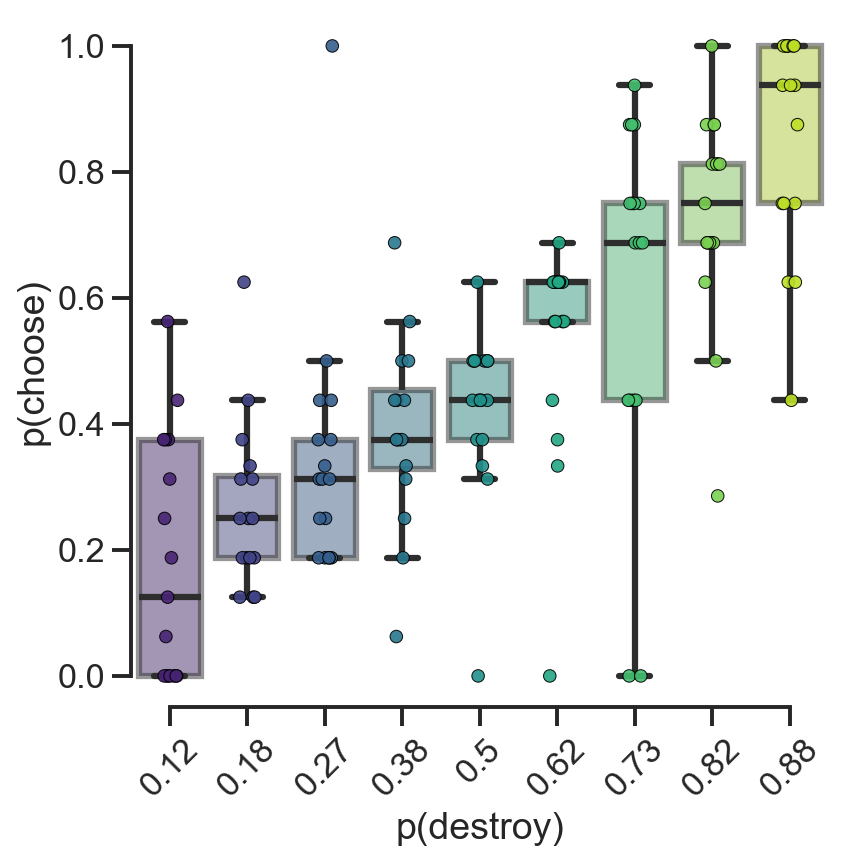

In [ ]:
df = pd.read_csv('../data/raw/controls14.csv')
df = df[df.expName=='FullPilot8']
df = df[df.session.isin([0])]
# ddf = df.copy()
# set id to prolificID
df['id'] = df.prolificID
# plot y as choice frequency for each p
# plot x as p
# plot size as N (number of trials with p)
pp = np.unique(np.array([df.p1.unique(), df.p2.unique()]).flatten())
# mm = np.unique(np.array([df.m1.unique(), df.m2.unique()]).flatten())
# print(pp)
logit = lambda x: 1/(1+np.exp(-2*x))
print(logit(np.linspace(-1, 1, 9)).round(2).tolist())
assert sorted(pp) == logit(np.linspace(-1, 1, 9)).round(2).tolist()
p_freq = []
m_freq = []
for pid in df.id.unique():
    ddf = df[(df.id == pid)]
    for p1 in pp:
        n_p1 = ((ddf.p1 == p1) | (ddf.p2 == p1)).sum()
        p_freq.append(
            {
             'id': pid,
             'p': p1,
             'choice_freq_p': ((ddf.p1 == p1) & (ddf.choice == 1) | (ddf.p2 == p1) & (ddf.choice == 2)).sum() / n_p1,
             'N_p': n_p1,
             'correct_p': ((ddf.p1 == p1) & (ddf.choice == 1)  & (ddf.p1 > ddf.p2) | (ddf.p2 == p1) & (ddf.choice == 2) & (ddf.p2 > ddf.p1)).sum() / n_p1,
            }
        )
    
    # for m in mm:
    #     n_m = ((ddf.m1 == m) | (ddf.m2 == m)).sum()
    #     m_freq.append(
    #         {
    #           'id': pid,
    #          'm': m,
    #          'choice_freq_m': ((ddf.m1 == m) & (ddf.choice == 1) | (ddf.m2 == m) & (ddf.choice == 2)).sum() / n_m,
    #          'N_m': n_m,
    #          'correct_m': ((ddf.m1 == m) & (ddf.choice == 1)  & (ddf.m1 > ddf.m2) | (ddf.m2 == m) & (ddf.choice == 2) & (ddf.m2 > ddf.m1)).sum() / n_m,
    #         }
    #     ) 

p_freq = pd.DataFrame(p_freq)
m_freq = pd.DataFrame(m_freq)

# plt.figure(figsize=(5, 4), dpi=150)
sns.set(rc={'figure.figsize':(6, 6), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
sns.boxplot(x='p', y='choice_freq_p', data=p_freq, showfliers=False, boxprops=dict(alpha=0.5), zorder=-1, palette='viridis', linewidth=3)   

sns.stripplot(x='p', y='choice_freq_p',data=p_freq, alpha=0.9, size=6, zorder=1, edgecolor='black', linewidth=0.5, palette='viridis')

# plot identity line
# plt.plot([0, len(pp)], [0, 1], color='black', linestyle='--', zorder=-10, alpha=0.8)
sns.despine(trim=True)
plt.ylabel('p(choose)')
plt.xlabel('p(destroy)')
plt.tick_params(axis='x', rotation=45)
# slides.add('bw.pptx')
# plot text for N on top of bars
# for i in range(d_freq.N
    # plt.text(i, d_freq.choice_freq[i], d_freq.N[i], ha='center', va='bottom')
# pairs = set(map(tuple, (np.array([df.p1, df.p2]).T)))
# pairs = sorted(pairs, key=lambda x: abs(x[0] - x[1]))

# count = 0
# for p in pp:
#     # (a) plot text for N p appears in a pair
#     # (b) plot N for N p appears in a pair and is best response
#     # must be a/b
#     a = sum([p in pair for pair in pairs])
#     b = sum([(p in pair) and (p == max(pair)) for pair in pairs])
#     plt.text(count, 0.5, f'{b}/{a}', ha='center', va='bottom', fontsize=8)
#     count += 1

(0.0, 1.0)

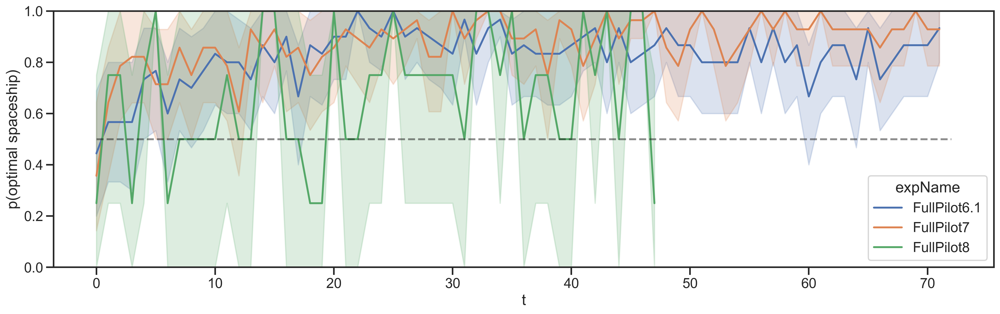

In [ ]:
# plot learning in session 1 over time (opti_ss)

df_ = df[df.session.isin([1])]
df_ = df_.groupby(['expName', 'prolificID', 't'], as_index=False).mean(numeric_only=True)
df_ = df_[df_.expName.isin(['FullPilot6.1', 'FullPilot7', 'FullPilot8'])]

sns.lineplot(x='t', y='opti_ss', hue='expName', data=df_)
plt.ylabel('p(optimal spaceship)')
plt.plot([0, 72], [0.5, 0.5], 'k--', alpha=0.5)
plt.ylim(0, 1)

In [ ]:
df_[df_.pair2=='easy'][['prolificID', 'opti_ss', 'opti_ff', 'opti_ev']].groupby('prolificID').mean()

,opti_ss,opti_ff,opti_ev
prolificID,,,
576ad50bc8a90000010d99c8,0.513889,0.597222,0.597222
5a3bdd2c8d005a0001829f3e,0.500000,0.944444,0.694444
5c95493ddd325800166f838a,0.791667,0.611111,0.736111
5d4b265b72db9d0015e8aac6,0.958333,0.555556,0.819444
5dc1eb838a84461511b3cd73,0.972222,0.527778,0.805556
5e307edef5abed05e1736185,0.555556,0.916667,0.708333
606b6705399a272af8238dad,0.791667,0.513889,0.680556
6079ff1600ff2b7455e1c3e0,1.000000,0.541667,0.861111
6117be8d81c34e0b13821371,0.448000,0.576000,0.480000


In [ ]:

df_[df_.pair2=='hard'][['prolificID', 'opti_ss', 'opti_ff', 'opti_ev']].groupby('prolificID').mean()

,opti_ss,opti_ff,opti_ev
prolificID,,,
576ad50bc8a90000010d99c8,0.652778,0.569444,0.638889
5c95493ddd325800166f838a,0.458333,0.638889,0.569444
5e307edef5abed05e1736185,0.555556,0.861111,0.819444
606b6705399a272af8238dad,0.861111,0.638889,0.750000
6117be8d81c34e0b13821371,0.488000,0.712000,0.600000
61230b14a3bcb65c585dfdaa,0.527778,0.916667,0.763889
62a96f8f6ab7e0c3ce90095f,0.930556,0.500000,0.638889
62ceba5fdab49dfc90278cbb,0.527778,0.500000,0.486111
63d13f416b2c25038c13007f,0.763889,0.597222,0.708333


In [ ]:
#2024-05-22 == fullpilot6.1
df.loc[df.datetime.str.contains('2024-05-22') & (df.expName=='FullPilot6'), 'expName'] = 'FullPilot6.1'
df.loc[df.expName=='FullPilot6', 'expName'] = 'FullPilot6.2'


c:\Python312\Lib\site-packages\seaborn\_core.py:1225: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='pair', ylabel='opti_ss'>

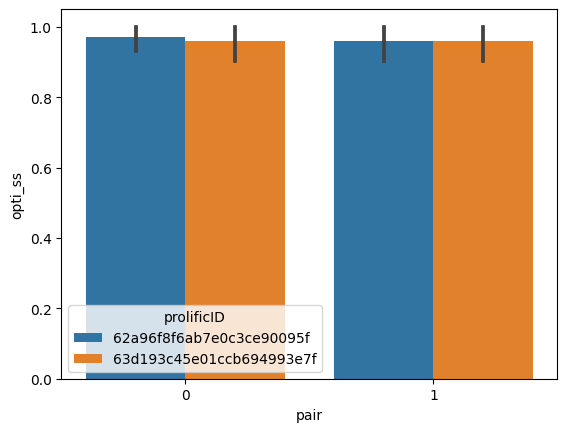

In [ ]:
df['opti_ss'] = df.choice==1 #((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))
dd = df[df.expName=='FullPilot6']
dd = dd[dd.session.isin([3])]

sns.barplot(y='opti_ss', x='pair', hue='prolificID',  data=dd)

AttributeError: Rectangle.set() got an unexpected keyword argument 'errorbar'

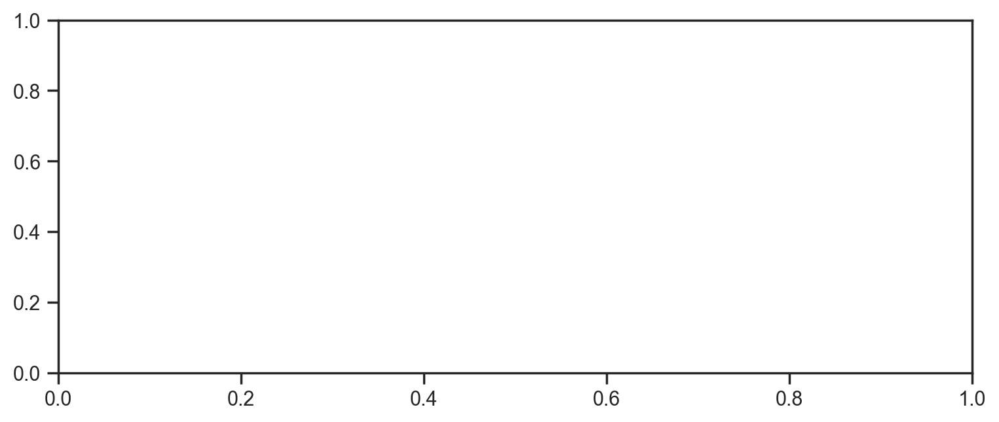

In [ ]:

sns.barplot(
    x='expName', y='score', data=df.groupby(['prolificID', 'expName'], as_index=True).score.max().reset_index(), errorbar='se',
    order=['FullPilot', 'FullPilot2', 'FullPilot3', 'FullPilot4', 'FullPilot5'])

In [ ]:
# compute ev delta 
df['ev_delta'] = (df.ev1 - df.ev2).abs()

plt.figure(figsize=(15, 5))
# show linear regression of ev delta on correct
sns.lmplot(x='ev_delta', y='correct', data=df[df.session.isin([2,3])])

#show that with pointplot
sns.pointplot(x='ev_delta', y='correct', linestyle='none', join=False,
              data=df[df.session.isin([2,3])].groupby(['prolificID', 'ev_delta'], as_index=False).mean())

plt.ylim(0,1)

# angle xticks
plt.xticks(rotation=45)

NameError: name 'plt' is not defined

2580
-2
-1
0
1


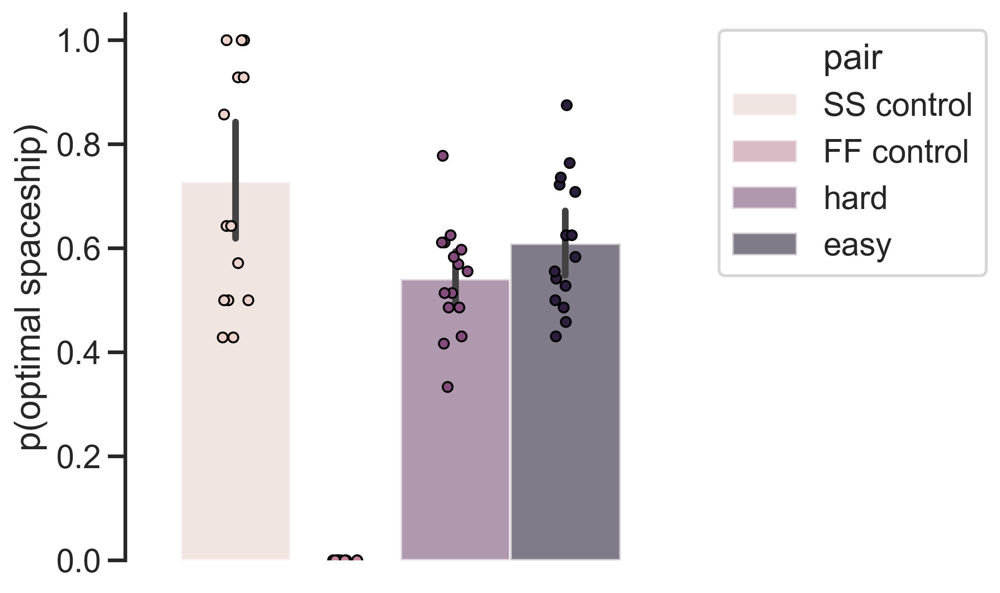

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
# df = df.groupby('prolificID').filter(lambda x: len(x) >= 300)

sns.set(rc={'figure.figsize':(5, 5), 'figure.dpi':300})
sns.set_context('talk')
sns.set_style('ticks')  
sns.set_palette('Set2')
df = pd.read_csv('../data/raw/controls14.csv')

df = df[df.expName.isin(['FullPilot', 'FullPilot2', 'FullPilot3', 'FullPilot4', 'FullPilot5', 'FullPilot6', 'FullPilot6.1', 'FullPilot7', 'FullPilot8'])]

# exclude prolificID with less than 432 trials
df = df.groupby('prolificID').filter(lambda x: len(x) >= 432)
# keep  prolificIDs that are more than 10 characters
df = df[df.prolificID.str.len() > 10]

# df = df[(df.prolificID=='unity') & df.datetime.str.contains('2024-06-04')] 

df = df[(df.session==3) & (df.expName=='FullPilot8')]
# drop duplicates
df = df.drop_duplicates(subset=['expName', 'session', 't', 'prolificID'], keep='last')
print(len(df))
# 
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ss'] = ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))

df = df.groupby(['expName', 'prolificID', 'pair'], as_index=False).mean(numeric_only=True)
sns.set_palette('Set2')
sns.barplot(x='expName', y='opti_ss', hue="pair", data=df, alpha=.6)
sns.stripplot(x='expName', y='opti_ss', hue="pair", data=df, dodge=True, edgecolor='black', linewidth=1)

plt.ylabel('p(optimal spaceship)')
plt.xlabel('')
#get x position of each bar from plt
x = [p.get_x() + p.get_width() / 2 for p in plt.gca().patches]

# add number of trial per pair in the legend
count = 0
for pair in sorted(df.pair.unique()):
    print(pair)
    n = len(df[(df.expName=='FullPilot8') & (df.pair==pair)])
    # plt.text(x=x[count], y=0.5, s=n, ha='center', va='center')
    count += 1
    
plt.xlabel('')
plt.xticks([])
sns.despine(bottom=True)


# get handles and labels of the legend
handles, labels = plt.gca().get_legend_handles_labels()
#set legend outside of the plot on the right
plt.legend(title='pair', handles=handles[:-4], bbox_to_anchor=(1.05, 1), loc='upper left', labels=['SS control', 'FF control', 'hard', 'easy'])


2580
-2
-1
0
1


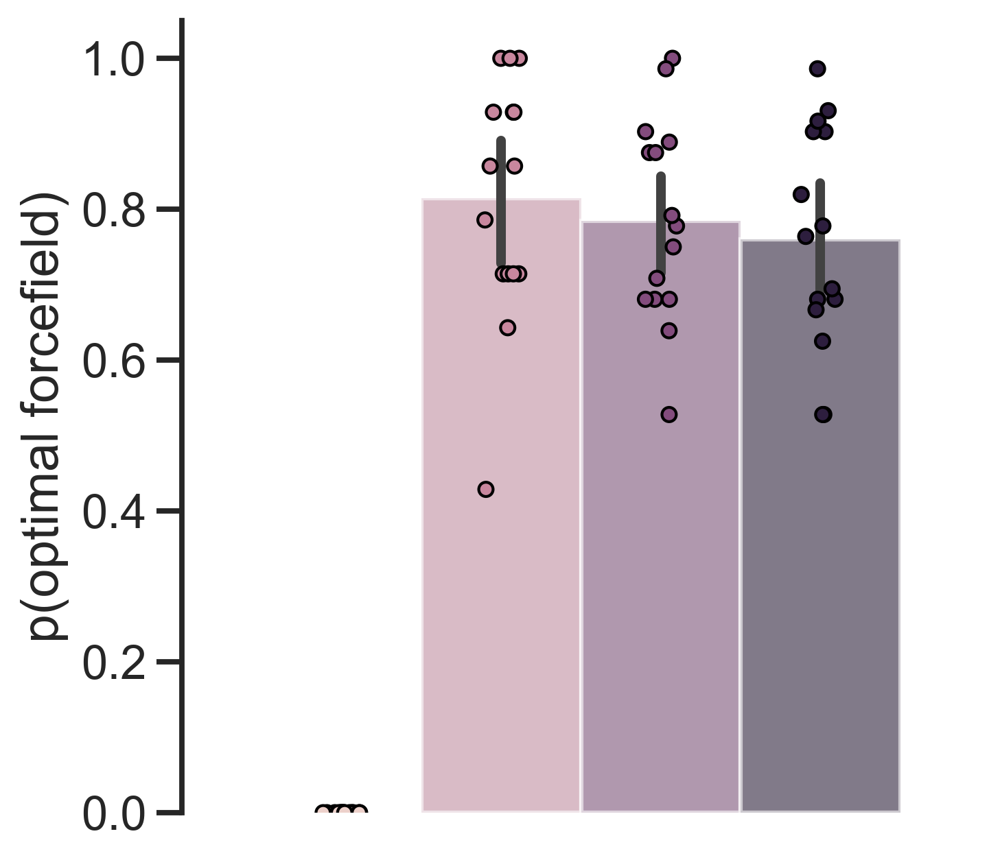

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
# df = df.groupby('prolificID').filter(lambda x: len(x) >= 300)

sns.set(rc={'figure.figsize':(5, 5), 'figure.dpi':300})
sns.set_context('talk')
sns.set_style('ticks')  
sns.set_palette('Set2')
df = pd.read_csv('../data/raw/controls14.csv')

df = df[df.expName.isin(['FullPilot', 'FullPilot2', 'FullPilot3', 'FullPilot4', 'FullPilot5', 'FullPilot6', 'FullPilot6.1', 'FullPilot7', 'FullPilot8'])]

# exclude prolificID with less than 432 trials
df = df.groupby('prolificID').filter(lambda x: len(x) >= 432)
# keep  prolificIDs that are more than 10 characters
df = df[df.prolificID.str.len() > 10]

# df = df[(df.prolificID=='unity') & df.datetime.str.contains('2024-06-04')] 

df = df[(df.session==3) & (df.expName=='FullPilot8')]
# drop duplicates
df = df.drop_duplicates(subset=['expName', 'session', 't', 'prolificID'], keep='last')
print(len(df))

df['p1'] = df.apply(lambda x: 1 if x.pair == -2 else x.p1, axis=1)
df['p2'] = df.apply(lambda x: 1 if x.pair == -2 else x.p2, axis=1)
# 
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ss'] = ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))

df = df.groupby(['expName', 'prolificID', 'pair'], as_index=False).mean(numeric_only=True)
sns.set_palette('Set2')
sns.barplot(x='expName', y='opti_ff', hue="pair", data=df, alpha=.6)
sns.stripplot(x='expName', y='opti_ff', hue="pair", data=df, dodge=True,linewidth=1, edgecolor='black')

plt.ylabel('p(optimal forcefield)')
plt.xlabel('')
plt.xticks([])
sns.despine(bottom=True)
#get x position of each bar from plt
x = [p.get_x() + p.get_width() / 2 for p in plt.gca().patches]

# add number of trial per pair in the legend
count = 0
for pair in sorted(df.pair.unique()):
    print(pair)
    n = len(df[(df.expName=='FullPilot8') & (df.pair==pair)])
    # plt.text(x=x[count], y=0.5, s=n, ha='center', va='center')
    count += 1
    
plt.legend([],[], frameon=False)
# get handles and labels of the legend
# handles, labels = plt.gca().get_legend_handles_labels()
#set legend outside of the plot on the right
# plt.legend(title='pair', handles=handles[:-4], bbox_to_anchor=(1.05, 1), loc='upper left', labels=['SS control', 'FF control', 'hard', 'easy'])


In [ ]:
df = pd.read_csv('../data/raw/controls14.csv')
df = df[(df.session==1) & (df.expName=='FullPilot8')]
df[df.pair==0]

,prolificID,expName,session,t,pair,choice,outcome1,outcome2,choseLeft,op1IsLeft,...,ev2,p1,p2,m1,m2,name1,name2,destroyed,score,datetime
50383,unity,FullPilot8,1,0,0,1,70,37,1,1,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,70,2024-06-04 20:59:48
50389,unity,FullPilot8,1,4,0,1,53,16,1,1,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,292,2024-06-04 21:00:49
50422,test,FullPilot8,1,0,0,1,61,25,0,0,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,61,2024-06-04 21:19:15
50423,test,FullPilot8,1,1,0,1,58,46,0,0,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,119,2024-06-04 21:19:19
50426,test,FullPilot8,1,4,0,0,65,32,0,1,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,0,185,2024-06-04 21:19:38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57376,5685850c333cbd000d4e042f,FullPilot8,1,29,0,1,53,28,1,1,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,1948,2024-06-05 15:24:55
57389,5685850c333cbd000d4e042f,FullPilot8,1,37,0,1,57,49,0,0,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,2416,2024-06-05 15:25:24
57396,5685850c333cbd000d4e042f,FullPilot8,1,42,0,1,61,24,0,0,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,2703,2024-06-05 15:25:43
57397,5685850c333cbd000d4e042f,FullPilot8,1,43,0,1,43,49,0,0,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,2746,2024-06-05 15:25:47
